In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import time
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

# Загрузка датасетов и первое знакомство

In [2]:
train = pd.read_parquet('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/train_interactions.parquet')
users = pd.read_parquet('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/users_meta.parquet.parquet')
items = pd.read_parquet('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/items_meta.parquet.parquet')
test = pd.read_csv('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/test_pairs.csv.csv')
subm = pd.read_csv('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/sample_submission.csv')

In [3]:
# path = r'D:\Книги\Программирование\ML_contests_хакатоны\VK_RecSys_Challenge_2024'
# train = pd.read_parquet(path + r'\train_interactions.parquet')
# users = pd.read_parquet(path + r'\users_meta.parquet.parquet')
# items = pd.read_parquet(path + r'\items_meta.parquet.parquet')
# test = pd.read_csv(path + r'\test_pairs.csv.csv')
# subm = pd.read_csv(path + r'\sample_submission.csv.csv')

In [4]:
# path = r'C:\Users\vsemis\files\VK_recsys_huck_2024'
# train = pd.read_parquet(path + r'\train_interactions.parquet')
# users = pd.read_parquet(path + r'\users_meta.parquet')
# items = pd.read_parquet(path + r'\items_meta.parquet')
# test = pd.read_csv(path + r'\test_pairs.csv')
# subm = pd.read_csv(path + r'\sample_submission.csv')

In [5]:
print(train.shape)
print(train.head(2))

(145667282, 7)
   user_id  item_id  timespent  like  dislike  share  bookmarks
0     3810   138979          6     0        0      0          0
1   101874   331160          6     0        0      0          0


In [6]:
print(users.shape)
print(users.head(2))

(183404, 3)
   user_id  gender  age
0        0       2   35
1        1       2   35


In [7]:
print(items.shape)
print(items.head(2))

(337727, 4)
   item_id  source_id  duration  \
0        0       1869        13   
1        1       1869         8   

                                          embeddings  
0  [0.07607838, 0.24312432, -0.07126159, 0.068710...  
1  [-0.2897247, 0.016220074, -0.14935663, 0.08754...  


In [8]:
print(test.shape, subm.shape)
print(test.head(2))
print(subm.head(2))

(1655120, 2) (1655120, 3)
   user_id  item_id
0        1     7363
1        1    73770
   user_id  item_id   predict
0        1     7363  0.507584
1        1    73770  0.261624


In [9]:
print(train.isna().sum().sum(),
      users.isna().sum().sum(),
      items.isna().sum().sum(),
      test.isna().sum().sum(),
      subm.isna().sum().sum())

0 0 0 0 0


In [10]:
train.user_id.nunique(), train.item_id.nunique()

(183404, 337727)

In [11]:
users.user_id.nunique()

183404

In [12]:
items.item_id.nunique(), items.source_id.nunique()

(337727, 19613)

In [13]:
# Посчитаем количество одинаковых user_id в train и users
train_user_id_unique = train.user_id.unique()
users_user_id_unique = users.user_id.unique()
print("train, user_id unic len:", len(train_user_id_unique), "\nusers, user_id unic len:", len(users_user_id_unique))
intersection = np.intersect1d(train_user_id_unique, users_user_id_unique)
print("Common user ID:", len(intersection))

train, user_id unic len: 183404 
users, user_id unic len: 183404
Common user ID: 183404


In [14]:
# Посчитаем количество одинаковых item_id в train и items
train_item_id_unique = train.item_id.unique()
items_item_id_unique = items.item_id.unique()
print("train, item_id len:", len(train_item_id_unique), "\nitems, item_id len:", len(items_item_id_unique))
intersection = np.intersect1d(train_item_id_unique, items_item_id_unique)
print("Common user ID:", len(intersection))

train, item_id len: 337727 
items, item_id len: 337727
Common user ID: 337727


# EDA и feature engineering

In [15]:
users.gender.value_counts()  # Посмотрим пол пользователей

gender
2    117200
1     66204
Name: count, dtype: int64

## Исследование пола и возраста, users_meta

In [16]:
users.age.nunique()

43

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


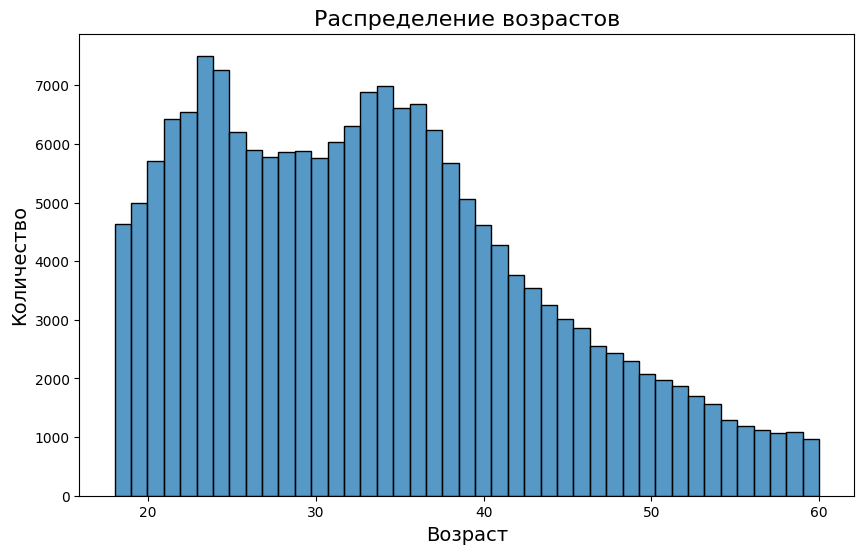

In [17]:
bins = users.age.nunique()

# Построение гистограммы с возраста пользователей
plt.figure(figsize=(10, 6))
sns.histplot(users['age'], bins=bins, kde=False)

plt.title('Распределение возрастов', fontsize=16)
plt.xlabel('Возраст', fontsize=14)
plt.ylabel('Количество', fontsize=14)

plt.show()

In [18]:
train['user_id'].value_counts().tail(15)  # Была идея остаить случаи с более чем 5 просмотрами,
# но таких случаев менее 10

user_id
114331    6
112482    6
148173    6
5308      6
165701    6
172711    6
115996    6
95566     6
119492    5
25795     5
134730    5
122460    4
50248     4
172629    3
9783      2
Name: count, dtype: int64

In [19]:
# Режем трейн, оставим только часть случаев
train = train.sample(frac=0.4, random_state=42)

In [20]:
train.shape

(58266913, 7)

In [21]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58266913 entries, 130893074 to 29017539
Data columns (total 7 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   user_id    uint32
 1   item_id    uint32
 2   timespent  uint8 
 3   like       uint8 
 4   dislike    uint8 
 5   share      uint8 
 6   bookmarks  uint8 
dtypes: uint32(2), uint8(5)
memory usage: 1.1 GB


In [22]:
# Генерация фичи gender
train = train.merge(users[['user_id', 'gender']], on='user_id', how='left')
train.head()

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender
0,174642,62621,115,0,0,0,0,1
1,32868,319656,25,0,0,0,0,2
2,169678,36731,26,0,0,0,0,1
3,92181,91365,31,0,0,0,0,1
4,181452,295779,25,0,0,0,0,2


In [23]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58266913 entries, 0 to 58266912
Data columns (total 8 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   user_id    uint32
 1   item_id    uint32
 2   timespent  uint8 
 3   like       uint8 
 4   dislike    uint8 
 5   share      uint8 
 6   bookmarks  uint8 
 7   gender     uint8 
dtypes: uint32(2), uint8(6)
memory usage: 777.9 MB


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


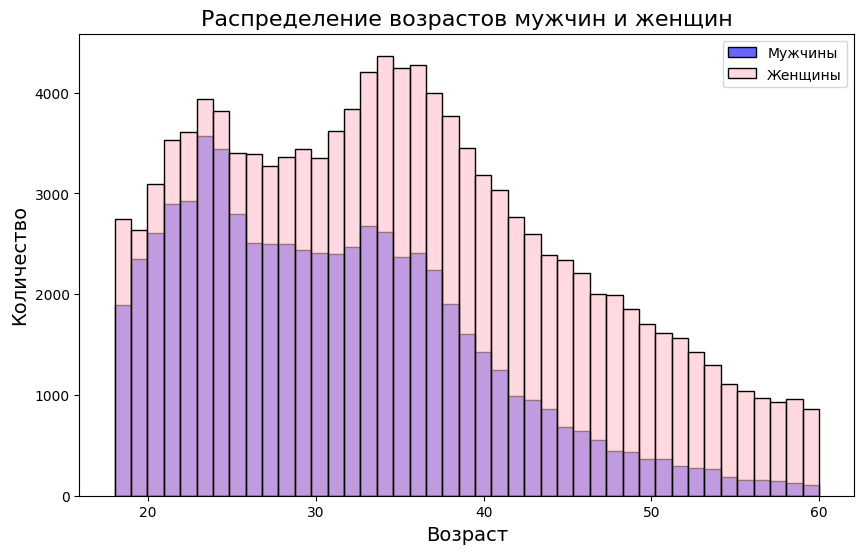

In [24]:
male_data = users[users['gender'] == 1]
female_data = users[users['gender'] == 2]

plt.figure(figsize=(10, 6))

# Гистограмма для мужчин (синий цвет)
sns.histplot(male_data['age'], bins=bins, color='blue', label='Мужчины', kde=False, alpha=0.6)
# Гистограмма для женщин (розовый цвет)
sns.histplot(female_data['age'], bins=bins, color='pink', label='Женщины', kde=False, alpha=0.6)

plt.legend()

plt.title('Распределение возрастов мужчин и женщин', fontsize=16)
plt.xlabel('Возраст', fontsize=14)
plt.ylabel('Количество', fontsize=14)

plt.show()

In [25]:
train = train.merge(users[['user_id', 'age']], on='user_id', how='left')  # Генерация фичи age
train.head()

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age
0,174642,62621,115,0,0,0,0,1,25
1,32868,319656,25,0,0,0,0,2,36
2,169678,36731,26,0,0,0,0,1,21
3,92181,91365,31,0,0,0,0,1,35
4,181452,295779,25,0,0,0,0,2,44


## Особенности видеоклипов, items_meta, связи с users_meta 

In [26]:
items.columns

Index(['item_id', 'source_id', 'duration', 'embeddings'], dtype='object')

In [27]:
items.item_id.nunique(), items.source_id.nunique()

(337727, 19613)

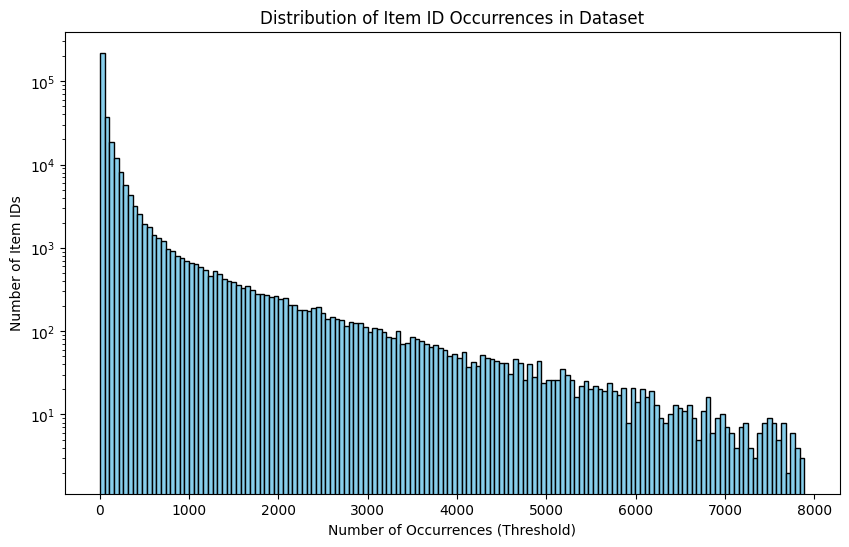

In [28]:
item_counts = train['item_id'].value_counts()

plt.figure(figsize=(10, 6))
plt.hist(item_counts, bins=150, color='skyblue', edgecolor='black')

plt.xlabel('Number of Occurrences (Threshold)')
plt.ylabel('Number of Item IDs')
plt.title('Distribution of Item ID Occurrences in Dataset')
plt.yscale('log')

plt.show()

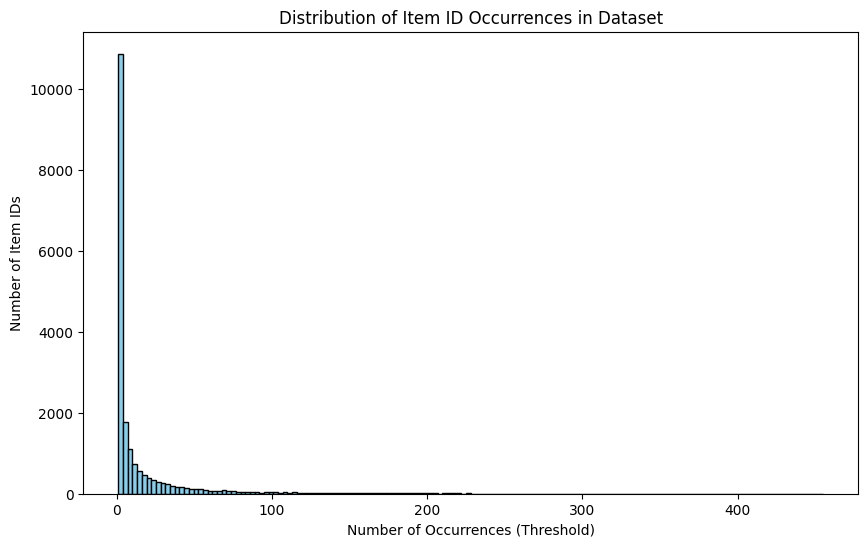

In [29]:
source_counts = items['source_id'].value_counts()

plt.figure(figsize=(10, 6))
plt.hist(source_counts, bins=150, color='skyblue', edgecolor='black')

plt.xlabel('Number of Occurrences (Threshold)')
plt.ylabel('Number of Item IDs')
plt.title('Distribution of Item ID Occurrences in Dataset')
# plt.yscale('log')

plt.show()

In [30]:
# Подсчёт общего количества видео
total_videos = source_counts.sum()

# Сумма первых 100 значений
top_100_videos = source_counts.head(100).sum()

# Доля от общего объёма в процентах
percentage_top_100 = (top_100_videos / total_videos) * 100

percentage_top_100  # Таким образом, 100 самых продуктивных авторов видео создать примерно 10% от всех роликов.

9.601838171067163

In [31]:
# Определяем, сколько авторов создало топ-80% самых популярных видео
total_videos = source_counts.sum()  # Общее количество видео
target_videos = total_videos * 0.8  # Целевая сумма для 80%

cumulative_sum = source_counts.cumsum()  # Создание кумулятивной суммы и фильтрация до тех пор, пока не достигнет 80% объёма
source_ids_80_percent = cumulative_sum[cumulative_sum <= target_videos].index.tolist()

if cumulative_sum.iloc[len(source_ids_80_percent)] < target_videos:  # Добавление ещё одного source_id, если последний не достигает 80%
    source_ids_80_percent.append(cumulative_sum.index[len(source_ids_80_percent)])

len(source_ids_80_percent)  # Почти 4000, или около 20% от всех авторов. Модель может надорваться всё это считать

3956

In [32]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58266913 entries, 0 to 58266912
Data columns (total 9 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   user_id    uint32
 1   item_id    uint32
 2   timespent  uint8 
 3   like       uint8 
 4   dislike    uint8 
 5   share      uint8 
 6   bookmarks  uint8 
 7   gender     uint8 
 8   age        uint8 
dtypes: uint32(2), uint8(7)
memory usage: 833.5 MB


# Генерация фич

In [33]:
import sys
import gc

# Функция для получения размеров всех объектов в мегабайтах
def get_memory_usage_mb():
    # Получаем все объекты в памяти
    objects = gc.get_objects()
    # Собираем информацию о переменных в текущем пространстве имен
    memory_usage = [
        (name, sys.getsizeof(obj) / (1024 * 1024))  # Преобразуем байты в мегабайты
        for name, obj in globals().items()
        if name != "memory_usage_mb"  # Исключаем текущую функцию
    ]
    # Сортируем по убыванию размера
    memory_usage.sort(key=lambda x: x[1], reverse=True)
    return memory_usage

# Печать всех переменных и их размеров в мегабайтах
for var, size in get_memory_usage_mb():
    print(f"{var}: {size:.6f} MB")

train: 833.515014 MB
items: 41.548659 MB
subm: 37.882828 MB
test: 25.255264 MB
item_counts: 3.862774 MB
female_data: 1.564804 MB
intersection: 1.288433 MB
train_item_id_unique: 1.288433 MB
items_item_id_unique: 1.288433 MB
users: 1.049583 MB
male_data: 0.883934 MB
train_user_id_unique: 0.699738 MB
users_user_id_unique: 0.699738 MB
source_counts: 0.224468 MB
cumulative_sum: 0.224468 MB
source_ids_80_percent: 0.030235 MB
_ii: 0.002426 MB
_i31: 0.002426 MB
_i33: 0.002325 MB
_i24: 0.001757 MB
_iii: 0.001219 MB
_i30: 0.001219 MB
_i3: 0.001212 MB
_i13: 0.001203 MB
_i14: 0.001174 MB
TSNE: 0.001022 MB
_i17: 0.000979 MB
_oh: 0.000610 MB
Out: 0.000610 MB
_i2: 0.000539 MB
_i18: 0.000481 MB
_26: 0.000429 MB
_i22: 0.000404 MB
_i25: 0.000390 MB
_i4: 0.000366 MB
_i19: 0.000365 MB
_ih: 0.000359 MB
In: 0.000359 MB
_i29: 0.000354 MB
_i28: 0.000346 MB
_i1: 0.000290 MB
_i15: 0.000261 MB
_25: 0.000209 MB
_22: 0.000204 MB
_i9: 0.000196 MB
_18: 0.000187 MB
open: 0.000137 MB
train_test_split: 0.000137 MB
roc_

In [34]:
# train = pd.read_parquet('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/train_interactions.parquet')
# train = train.merge(users[['user_id', 'gender']], on='user_id', how='left')  # Генерация фичи gender
# train = train.merge(users[['user_id', 'age']], on='user_id', how='left')  # Генерация фичи age
# train.info()

In [35]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58266913 entries, 0 to 58266912
Data columns (total 9 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   user_id    uint32
 1   item_id    uint32
 2   timespent  uint8 
 3   like       uint8 
 4   dislike    uint8 
 5   share      uint8 
 6   bookmarks  uint8 
 7   gender     uint8 
 8   age        uint8 
dtypes: uint32(2), uint8(7)
memory usage: 833.5 MB


In [36]:
# Генерация фичи item_id_total_views (это будет мера популярности видео, Количество просмотров)
counts = train['item_id'].value_counts().reset_index()
counts.columns = ['item_id', 'item_id_total_views']
counts['item_id_total_views'] = counts['item_id_total_views'].astype('uint16')
train = train.merge(counts, on='item_id', how='left')
train.head(2)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views
0,174642,62621,115,0,0,0,0,1,25,1570
1,32868,319656,25,0,0,0,0,2,36,3666


In [37]:
train.head(2)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views
0,174642,62621,115,0,0,0,0,1,25,1570
1,32868,319656,25,0,0,0,0,2,36,3666


In [38]:
# Генерация фичи source_id и фичи source_id_total_views (это будет id и мера популярности канала, общее количество просмотров)
train = train.merge(items[['item_id', 'source_id']], on='item_id', how='left')
counts = train.source_id.value_counts()
counts = counts.to_frame().reset_index()
counts.columns = ['source_id', 'source_id_total_views']
counts['source_id_total_views'] = counts['source_id_total_views'].astype('uint32')
train = train.merge(counts, on='source_id', how='left')
train.head(2)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,source_id,source_id_total_views
0,174642,62621,115,0,0,0,0,1,25,1570,11615,1570
1,32868,319656,25,0,0,0,0,2,36,3666,1300,14982


In [39]:
items.head(2)

,item_id,source_id,duration,embeddings
0,0,1869,13,"[0.07607838, 0.24312432, -0.07126159, 0.068710..."
1,1,1869,8,"[-0.2897247, 0.016220074, -0.14935663, 0.08754..."


In [40]:
# Генерация фичи source_id_familiar (Смотрел ли пользователь видео с этого же канала)
# Создаем копию нужных колонок для обработки
res = train[['user_id', 'source_id']]

# Сортируем для удобства обработки
res = res.sort_values(by=['user_id', 'source_id']).reset_index()

# Инициализация массивов
user_ids = res['user_id'].to_numpy()
source_ids = res['source_id'].to_numpy()
source_id_familiar = np.zeros(len(res), dtype=int)

# Отслеживание "знакомых" источников
seen_sources = {}
for i in range(len(user_ids)):
    user_id = user_ids[i]
    source_id = source_ids[i]
    if user_id not in seen_sources:
        seen_sources[user_id] = set()
    if source_id in seen_sources[user_id]:
        source_id_familiar[i] = 1
    else:
        seen_sources[user_id].add(source_id)

# Добавляем колонку с результатами в res
res['source_id_familiar'] = source_id_familiar

# Восстанавливаем исходный порядок строк train
train['source_id_familiar'] = res.sort_values(by='index')['source_id_familiar'].to_numpy().astype('int8')
del res

In [41]:
source_id_familiar
del source_id_familiar

In [42]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58266913 entries, 0 to 58266912
Data columns (total 13 columns):
 #   Column                 Dtype 
---  ------                 ----- 
 0   user_id                uint32
 1   item_id                uint32
 2   timespent              uint8 
 3   like                   uint8 
 4   dislike                uint8 
 5   share                  uint8 
 6   bookmarks              uint8 
 7   gender                 uint8 
 8   age                    uint8 
 9   item_id_total_views    uint16
 10  source_id              uint32
 11  source_id_total_views  uint32
 12  source_id_familiar     int8  
dtypes: int8(1), uint16(1), uint32(4), uint8(7)
memory usage: 1.4 GB


In [43]:
"""
sns.set(style="whitegrid")

# Создание фигуры с подграфиками для каждого столбца (timespent, share, bookmarks)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Построение боксплотов для каждого столбца
sns.boxplot(x="like", y="timespent", data=train, ax=axes[0])
axes[0].set_title('Timespent by Like')
axes[0].set_xlabel('Like')
axes[0].set_ylabel('Timespent')

sns.boxplot(x="like", y="share", data=train, ax=axes[1])
axes[1].set_title('Share by Like')
axes[1].set_xlabel('Like')
axes[1].set_ylabel('Share')

sns.boxplot(x="like", y="bookmarks", data=train, ax=axes[2])
axes[2].set_title('Bookmarks by Like')
axes[2].set_xlabel('Like')
axes[2].set_ylabel('Bookmarks')

# Показываем графики
plt.tight_layout()
plt.show()
"""

'\nsns.set(style="whitegrid")\n\n# Создание фигуры с подграфиками для каждого столбца (timespent, share, bookmarks)\nfig, axes = plt.subplots(1, 3, figsize=(18, 6))\n\n# Построение боксплотов для каждого столбца\nsns.boxplot(x="like", y="timespent", data=train, ax=axes[0])\naxes[0].set_title(\'Timespent by Like\')\naxes[0].set_xlabel(\'Like\')\naxes[0].set_ylabel(\'Timespent\')\n\nsns.boxplot(x="like", y="share", data=train, ax=axes[1])\naxes[1].set_title(\'Share by Like\')\naxes[1].set_xlabel(\'Like\')\naxes[1].set_ylabel(\'Share\')\n\nsns.boxplot(x="like", y="bookmarks", data=train, ax=axes[2])\naxes[2].set_title(\'Bookmarks by Like\')\naxes[2].set_xlabel(\'Like\')\naxes[2].set_ylabel(\'Bookmarks\')\n\n# Показываем графики\nplt.tight_layout()\nplt.show()\n'

In [44]:
# Вообще неправильно. Надо сделать новую таблицу, и записать в неё только уникальные user_id из train
# И потом собрать в таблицу фичи
# И хорошо подумать, надо ли делать презентацию признаков по полному train, если можно собрать их в компактный
# Блин, надо, так как нам нужны все комбинации юзеров и видео ID
# При сборе в компакнтый - делать разные графики

In [45]:
# Структура timespent
train.timespent.nunique()

255

In [46]:
train.timespent.unique()

array([115,  25,  26,  31,   6,  13,   5,  16,  29,  27,   2,  18,  15,
        22,  64,   1,  10,   4,  39,  38,  61,  57,  11,  17,  58,  60,
         7,  28,  50,  74,   9,   3,   8,  62,  19,  72,  56,  49,  48,
        14,  35,  33,  32,  34,  30,  52,  21,  12,  71,  59,  45, 166,
        23,  24,  90,  36,  66,  43,  37,  73,  44,  46,  20, 137,  41,
        75, 111,  40,  42,  63,  55,  54,  65,  82,  53,  70,  99,  47,
        76, 163,  67,  51,  93, 157, 159,  80, 142,  85, 103, 105,  89,
       126,  83,  78, 148, 181, 107, 229, 101, 147, 108, 186, 102, 178,
        97, 127, 250, 114,  77,  91,  69,  84,  92,  86, 120, 167,  68,
       150, 214,  79, 133, 162, 113,  81, 151,  95,  96, 104,  88, 118,
       180, 168, 140,  87, 110, 171, 131, 121, 100,  94, 174, 172, 155,
       106, 153, 138, 145, 201, 112, 132, 125, 124, 158, 119, 152, 134,
       144, 146, 116,  98, 203, 169, 175, 195, 255, 194, 197, 117, 160,
       139, 179, 173, 128, 122, 109, 135, 136, 191, 143, 239, 14

In [47]:
counts = train['user_id'].value_counts().reset_index()

In [48]:
counts

,user_id,count
0,23742,1801
1,93030,1798
2,10990,1797
3,61942,1790
4,122249,1788
...,...,...
183394,119492,1
183395,40773,1
183396,25795,1
183397,139641,1


In [49]:
# Старая идея:
# Что, если отсеять данные о пользователях, которые смотрят мало видео?
# Можно тогда в качестве предсказания делать для них некую "модальную" величину.
# Или, например, созать фичи для тех, кто посмотрел больше, чем некое пороговое количество видео, а для остальных
# заполнить данные медианой просмотров?
# После проверки частоты просмотров отказались

In [50]:
# Генерация фичи user_total_views (общее количество просмотров у пользователя, мера его активности)
counts = train['user_id'].value_counts().reset_index()
counts.columns = ['user_id', 'user_total_views']
counts['user_total_views'] = counts['user_total_views'].astype('uint16')
train = train.merge(counts, on='user_id', how='left')
train.head(2)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,source_id,source_id_total_views,source_id_familiar,user_total_views
0,174642,62621,115,0,0,0,0,1,25,1570,11615,1570,0,215
1,32868,319656,25,0,0,0,0,2,36,3666,1300,14982,0,639


In [51]:
counts[counts['user_id'] == 174642]  # Проверим

,user_id,user_total_views
97097,174642,215


In [52]:
train[train['user_id'] == 174642].head()

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,source_id,source_id_total_views,source_id_familiar,user_total_views
0,174642,62621,115,0,0,0,0,1,25,1570,11615,1570,0,215
105627,174642,44917,18,0,0,0,0,1,25,955,3990,72383,0,215
574359,174642,44940,6,0,0,0,0,1,25,1441,11986,1441,0,215
728097,174642,208451,158,0,0,0,0,1,25,7208,1334,18409,0,215
1083701,174642,25377,12,0,0,0,0,1,25,1557,5551,248921,0,215


In [53]:
# Генерация фичи duration (просто переносим duration из items в train по item_id)
train = train.merge(items[['item_id', 'duration']], on='item_id', how='left')

In [54]:
# Генерация фичи attention (timespent/duration), (доля просмотра конкретного видео конкретным пользователем. Характеризует частный интерес)
train['attention'] = train['timespent'] / train['duration']
train['attention'] = train['attention'].astype('float32')
train[train['user_id'] == 174642].head(5)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,source_id,source_id_total_views,source_id_familiar,user_total_views,duration,attention
0,174642,62621,115,0,0,0,0,1,25,1570,11615,1570,0,215,114,1.008772
105627,174642,44917,18,0,0,0,0,1,25,955,3990,72383,0,215,18,1.000000
574359,174642,44940,6,0,0,0,0,1,25,1441,11986,1441,0,215,60,0.100000
728097,174642,208451,158,0,0,0,0,1,25,7208,1334,18409,0,215,16,9.875000
1083701,174642,25377,12,0,0,0,0,1,25,1557,5551,248921,0,215,54,0.222222


In [55]:
# Генерация фичи atten_mean (среднее время просмотра видео конкретным пользователем. Характеризует интерес, среднее)
counts = train.groupby('user_id')['attention'].mean().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_mean'))

In [56]:
train[train['user_id'] == 174642].head(5)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,source_id,source_id_total_views,source_id_familiar,user_total_views,duration,attention,attention_mean
0,174642,62621,115,0,0,0,0,1,25,1570,11615,1570,0,215,114,1.008772,1.265537
105627,174642,44917,18,0,0,0,0,1,25,955,3990,72383,0,215,18,1.000000,1.265537
574359,174642,44940,6,0,0,0,0,1,25,1441,11986,1441,0,215,60,0.100000,1.265537
728097,174642,208451,158,0,0,0,0,1,25,7208,1334,18409,0,215,16,9.875000,1.265537
1083701,174642,25377,12,0,0,0,0,1,25,1557,5551,248921,0,215,54,0.222222,1.265537


In [57]:
# Генерация фичи atten_median (медиана время просмотра видео конкретным пользователем. Характеризует интерес, медиана)
counts = train.groupby('user_id')['attention'].median().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_median'))

In [58]:
# Генерация фичи video_duration_median (медиана продолжительности видео, просматриваемых пользователем. Характеризует интерес пользователя к метрике)
counts = train.groupby('user_id')['duration'].median().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_median'))

In [59]:
# Генерация фичи user_like_mean (Среднее количество лайков)
counts = train.groupby('user_id')['like'].mean().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_mean'))

In [60]:
# Генерация фичи user_dislike_mean (Среднее количество дизлайков)
counts = train.groupby('user_id')['dislike'].mean().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_mean'))

In [61]:
# Генерация фичи user_share_mean (Среднее количество "поделиться" видео)
counts = train.groupby('user_id')['share'].mean().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_mean'))

In [62]:
# Генерация фичи user_bookmarks_mean (Среднее количество помещений в закладки)
counts = train.groupby('user_id')['bookmarks'].mean().astype('float32')
train = train.merge(counts, on='user_id', suffixes=('', '_mean'))

In [63]:
train[train['user_id'] == 174642].head(5)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,...,user_total_views,duration,attention,attention_mean,attention_median,duration_median,like_mean,dislike_mean,share_mean,bookmarks_mean
0,174642,62621,115,0,0,0,0,1,25,1570,...,215,114,1.008772,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0
105627,174642,44917,18,0,0,0,0,1,25,955,...,215,18,1.000000,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0
574359,174642,44940,6,0,0,0,0,1,25,1441,...,215,60,0.100000,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0
728097,174642,208451,158,0,0,0,0,1,25,7208,...,215,16,9.875000,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0
1083701,174642,25377,12,0,0,0,0,1,25,1557,...,215,54,0.222222,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0


In [64]:
# Генерация фичи attention_total_median (Медиана времени просмотра (attention) видео по датасету)
counts = train.groupby('item_id')['attention'].median().astype('float32')
train = train.merge(counts, on='item_id', suffixes=('', '_total_median'))

In [65]:
# Генерация фичи like_video_mean (среднее количество like для конкретного видео по всему датасету)
counts = train.groupby('item_id')['like'].mean().astype('float32')
train = train.merge(counts, on='item_id', suffixes=('', '_video_mean'))

In [66]:
train[train['user_id'] == 174642].head(5)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,...,attention,attention_mean,attention_median,duration_median,like_mean,dislike_mean,share_mean,bookmarks_mean,attention_total_median,like_video_mean
0,174642,62621,115,0,0,0,0,1,25,1570,...,1.008772,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0,0.105263,0.003822
105627,174642,44917,18,0,0,0,0,1,25,955,...,1.000000,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0,0.888889,0.095288
574359,174642,44940,6,0,0,0,0,1,25,1441,...,0.100000,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0,0.416667,0.002776
728097,174642,208451,158,0,0,0,0,1,25,7208,...,9.875000,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0,1.000000,0.004856
1083701,174642,25377,12,0,0,0,0,1,25,1557,...,0.222222,1.265537,1.0,28.0,0.004651,0.0,0.0,0.0,0.166667,0.011561


In [67]:
# Генерация фичи dislike_video_mean (среднее количество dislike для конкретного видео по всему датасету)
counts = train.groupby('item_id')['dislike'].mean().astype('float32')
train = train.merge(counts, on='item_id', suffixes=('', '_video_mean'))

In [68]:
# Генерация фичи share_video_mean (среднее количество share для конкретного видео по всему датасету)
counts = train.groupby('item_id')['share'].mean().astype('float32')
train = train.merge(counts, on='item_id', suffixes=('', '_video_mean'))

In [69]:
# Генерация фичи bookmarks_video_mean (среднее количество bookmarks для конкретного видео по всему датасету)
counts = train.groupby('item_id')['bookmarks'].mean().astype('float32')
train = train.merge(counts, on='item_id', suffixes=('', '_video_mean'))

In [70]:
# Генерация фичи age_liked_median (медиана возраста пользователя, лайкнувшего конкретное видео по всему датасету)
counts = train[train['like'] == 1]  # Селектор
counts = counts.groupby('item_id')['age'].median().astype('int16')
train = train.merge(counts, on='item_id', suffixes=('', '_liked_median'), how='left')

In [71]:
train['age_liked_median'] = train['age_liked_median'].fillna(train['age_liked_median'].median()).astype('int8')

In [72]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58266913 entries, 0 to 58266912
Data columns (total 29 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   user_id                 uint32 
 1   item_id                 uint32 
 2   timespent               uint8  
 3   like                    uint8  
 4   dislike                 uint8  
 5   share                   uint8  
 6   bookmarks               uint8  
 7   gender                  uint8  
 8   age                     uint8  
 9   item_id_total_views     uint16 
 10  source_id               uint32 
 11  source_id_total_views   uint32 
 12  source_id_familiar      int8   
 13  user_total_views        uint16 
 14  duration                uint8  
 15  attention               float32
 16  attention_mean          float32
 17  attention_median        float32
 18  duration_median         float32
 19  like_mean               float32
 20  dislike_mean            float32
 21  share_mean              float

In [73]:
# Генерация фичи age_disliked_median (медиана возраста пользователя, лайкнувшего конкретное видео по всему датасету)
counts = train[train['dislike'] == 1]  # Селектор
counts = counts.groupby('item_id')['age'].median().astype('float32')
train = train.merge(counts, on='item_id', suffixes=('', '_disliked_median'), how='left')

In [74]:
train['age_disliked_median'] = train['age_disliked_median'].fillna(train['age_disliked_median'].median()).astype('int8')

In [75]:
# Генерация фичи gender_liked_mode (Мода пола лайкнувшего видео)
counts = train[train['like'] == 1]  # Селектор
gender_mode = counts.groupby('item_id')['gender'].agg(lambda x: x.mode()[0]).reset_index()  # 1. Группируем
gender_mode.columns = ['item_id', 'gender_liked_mode']
train = train.merge(gender_mode, on='item_id', how='left')  # 2. Сливаем результат с исходным датафреймом train
del counts, gender_mode

In [76]:
train['gender_liked_mode'] = train['gender_liked_mode'].fillna(train['gender_liked_mode'].mean()).astype('float32')

In [77]:
# Генерация фичи age_difference (Разница между возрастом пользователя и медианой возраста тех, кто лайкает видео)
train['age_difference'] = train['age_liked_median'] - train['age']

In [78]:
# Генерация фичи gender_difference (Совпадает ли пол пользователя с модой пола тех, кто лайкает видео)
train['gender_difference'] = (train['gender'] == train['gender_liked_mode']).astype('int8')

In [79]:
# train = train.drop(columns={'age_liked_median'})  # Удалим ошибку

In [80]:
train.isna().sum()

user_id                   0
item_id                   0
timespent                 0
like                      0
dislike                   0
share                     0
bookmarks                 0
gender                    0
age                       0
item_id_total_views       0
source_id                 0
source_id_total_views     0
source_id_familiar        0
user_total_views          0
duration                  0
attention                 0
attention_mean            0
attention_median          0
duration_median           0
like_mean                 0
dislike_mean              0
share_mean                0
bookmarks_mean            0
attention_total_median    0
like_video_mean           0
dislike_video_mean        0
share_video_mean          0
bookmarks_video_mean      0
age_liked_median          0
age_disliked_median       0
gender_liked_mode         0
age_difference            0
gender_difference         0
dtype: int64

In [81]:
train[train['user_id'] == 174642].head(5)

,user_id,item_id,timespent,like,dislike,share,bookmarks,gender,age,item_id_total_views,...,attention_total_median,like_video_mean,dislike_video_mean,share_video_mean,bookmarks_video_mean,age_liked_median,age_disliked_median,gender_liked_mode,age_difference,gender_difference
0,174642,62621,115,0,0,0,0,1,25,1570,...,0.105263,0.003822,0.001274,0.001274,0.000000,29,32,1.0,4,1
105627,174642,44917,18,0,0,0,0,1,25,955,...,0.888889,0.095288,0.000000,0.045026,0.001047,38,33,1.0,13,1
574359,174642,44940,6,0,0,0,0,1,25,1441,...,0.416667,0.002776,0.000694,0.001388,0.001388,34,23,1.0,9,1
728097,174642,208451,158,0,0,0,0,1,25,7208,...,1.000000,0.004856,0.000277,0.003885,0.000416,26,30,1.0,1,1
1083701,174642,25377,12,0,0,0,0,1,25,1557,...,0.166667,0.011561,0.000642,0.003211,0.000000,24,44,2.0,-1,0


In [82]:
train['source_id_total_views'] = np.sqrt(train['source_id_total_views'])

In [83]:
train['like_dislike'] = train['like'].astype('int16') - train['dislike'].astype('int16')
train = train.drop(columns=['like', 'dislike'])
# Преобразуем 'like_dislike' к int8, если значения укладываются в диапазон int8
train['like_dislike'] = train['like_dislike'].astype('int8')

In [84]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58266913 entries, 0 to 58266912
Data columns (total 32 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   user_id                 uint32 
 1   item_id                 uint32 
 2   timespent               uint8  
 3   share                   uint8  
 4   bookmarks               uint8  
 5   gender                  uint8  
 6   age                     uint8  
 7   item_id_total_views     uint16 
 8   source_id               uint32 
 9   source_id_total_views   float64
 10  source_id_familiar      int8   
 11  user_total_views        uint16 
 12  duration                uint8  
 13  attention               float32
 14  attention_mean          float32
 15  attention_median        float32
 16  duration_median         float32
 17  like_mean               float32
 18  dislike_mean            float32
 19  share_mean              float32
 20  bookmarks_mean          float32
 21  attention_total_median  float

In [85]:
train.nunique()

user_id                   183399
item_id                   337533
timespent                    255
share                          2
bookmarks                      2
gender                         2
age                           43
item_id_total_views         4865
source_id                  19607
source_id_total_views       5130
source_id_familiar             2
user_total_views            1750
duration                     176
attention                  25965
attention_mean            182178
attention_median           21029
duration_median              162
like_mean                  27339
dislike_mean                2715
share_mean                 14164
bookmarks_mean              4027
attention_total_median      9340
like_video_mean            25164
dislike_video_mean          5159
share_video_mean           16263
bookmarks_video_mean        6881
age_liked_median              43
age_disliked_median           43
gender_liked_mode              3
age_difference                85
gender_dif

In [86]:
# train['like_dislike'].unique()

In [133]:
train['like_dislike'].value_counts()

NameError: name 'train' is not defined

In [88]:
train.to_parquet('/kaggle/working/train_interactions_04_data_n_featues.parquet')

In [89]:
for var, size in get_memory_usage_mb():
    print(f"{var}: {size:.6f} MB")

train: 5167.792371 MB
items: 41.548659 MB
subm: 37.882828 MB
test: 25.255264 MB
seen_sources: 10.000092 MB
item_counts: 3.862774 MB
_48: 2.098972 MB
female_data: 1.564804 MB
intersection: 1.288433 MB
train_item_id_unique: 1.288433 MB
items_item_id_unique: 1.288433 MB
users: 1.049583 MB
male_data: 0.883934 MB
train_user_id_unique: 0.699738 MB
users_user_id_unique: 0.699738 MB
source_counts: 0.224468 MB
cumulative_sum: 0.224468 MB
source_ids_80_percent: 0.030235 MB
_80: 0.003485 MB
__: 0.003424 MB
_85: 0.003424 MB
_i40: 0.003225 MB
_i31: 0.002426 MB
_i33: 0.002325 MB
_i43: 0.002254 MB
_i24: 0.001757 MB
_i38: 0.001558 MB
_43: 0.001451 MB
_i49: 0.001406 MB
_i44: 0.001352 MB
_i75: 0.001331 MB
_i30: 0.001219 MB
_i3: 0.001212 MB
_i13: 0.001203 MB
_i14: 0.001174 MB
_i36: 0.001129 MB
_oh: 0.001122 MB
Out: 0.001122 MB
_i50: 0.001121 MB
_i73: 0.001083 MB
_i70: 0.001052 MB
_i34: 0.001023 MB
TSNE: 0.001022 MB
_i54: 0.001015 MB
_i58: 0.001006 MB
_i17: 0.000979 MB
_i83: 0.000907 MB
_i57: 0.000900 MB


# tSNE map

In [90]:
# Режем train_tsne, оставим только часть строк
train_tsne = train.sample(60000, random_state=42)
del train

In [91]:
# Отбор
train_tsne = train_tsne.drop(columns={'user_id', 'item_id', 'source_id'})

In [92]:
# Вырежем лайки и дизлайки перед построением t-SNE карты
train_tsne_like_dislike = train_tsne[['like_dislike']]
train_tsne = train_tsne.drop(columns={'like_dislike'})

In [93]:
# Z-нормализация
train_tsne = (train_tsne - train_tsne.mean()) / train_tsne.std()

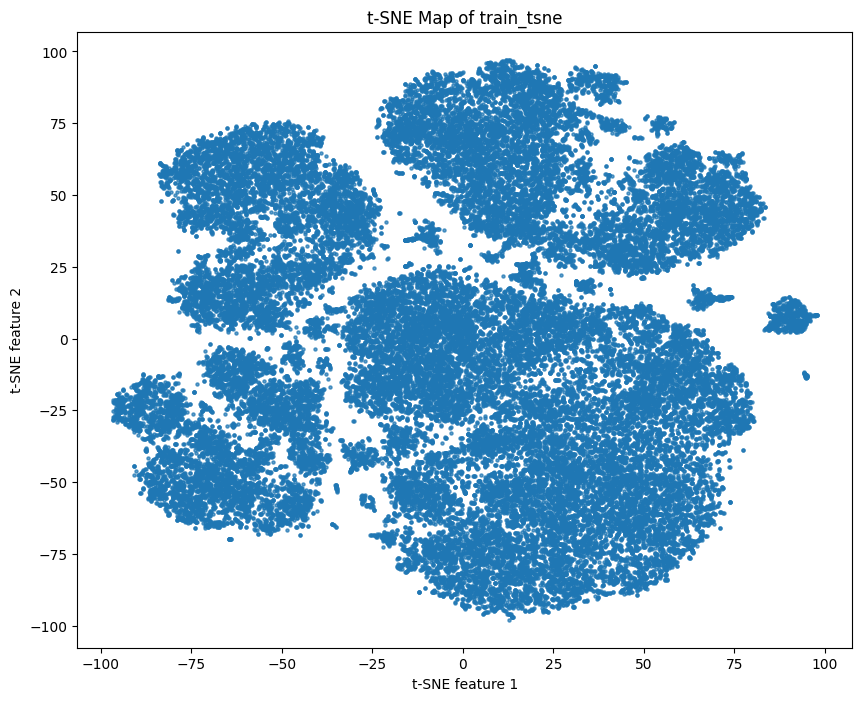

In [94]:
train_tsne_numeric = train_tsne.select_dtypes(include=[np.number])

# Инициализация t-SNE
tsne = TSNE(n_components=2, random_state=42)

# Применение t-SNE к данным
tsne_results = tsne.fit_transform(train_tsne_numeric)

# Создание scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=5, alpha=0.7)
plt.title("t-SNE Map of train_tsne")
plt.xlabel("t-SNE feature 1")
plt.ylabel("t-SNE feature 2")
plt.show()

In [95]:
tsne_results

array([[ 21.067959, -61.967575],
       [-48.090164,  40.49188 ],
       [ 17.29582 ,  52.270393],
       ...,
       [-38.04231 , -35.062756],
       [ 67.209114,  41.198418],
       [ 24.349236, -83.40264 ]], dtype=float32)

In [96]:
tsne_results.shape

(60000, 2)

In [97]:
tsne_results[:, 0], tsne_results[:, 1]

(array([ 21.067959, -48.090164,  17.29582 , ..., -38.04231 ,  67.209114,
         24.349236], dtype=float32),
 array([-61.967575,  40.49188 ,  52.270393, ..., -35.062756,  41.198418,
        -83.40264 ], dtype=float32))

In [98]:
# Добавляем t-SNE данные в датасет
train_tsne['tSNE_f1'] = tsne_results[:, 0]
train_tsne['tSNE_f2'] = tsne_results[:, 1]

In [99]:
# Возвращаем лайки и дизлайки
train_tsne[['like_dislike']] = train_tsne_like_dislike[['like_dislike']]

In [100]:
train_tsne.head(3)

,timespent,share,bookmarks,gender,age,item_id_total_views,source_id_total_views,source_id_familiar,user_total_views,duration,...,share_video_mean,bookmarks_video_mean,age_liked_median,age_disliked_median,gender_liked_mode,age_difference,gender_difference,tSNE_f1,tSNE_f2,like_dislike
19378894,-0.768798,-0.102431,-0.028879,0.806209,-0.000647,-0.653071,-1.294799,-0.739932,0.656302,1.112315,...,0.126600,-0.259553,1.076769,-0.048083,0.775118,0.774936,0.643677,21.067959,-61.967575,0
19223807,0.324995,-0.102431,-0.028879,-1.240353,1.342538,0.832041,-0.003733,-0.739932,-1.381231,-0.087049,...,-0.154409,-0.259553,0.643217,-0.227128,0.775118,-0.887783,-1.553548,-48.090164,40.491879,0
8733228,-0.856301,-0.102431,-0.028879,-1.240353,-1.343833,0.075088,-0.475685,-0.739932,-1.364799,-0.446858,...,-0.634785,-0.259553,-1.380030,-0.048083,-1.389358,0.359256,0.643677,17.295820,52.270393,0


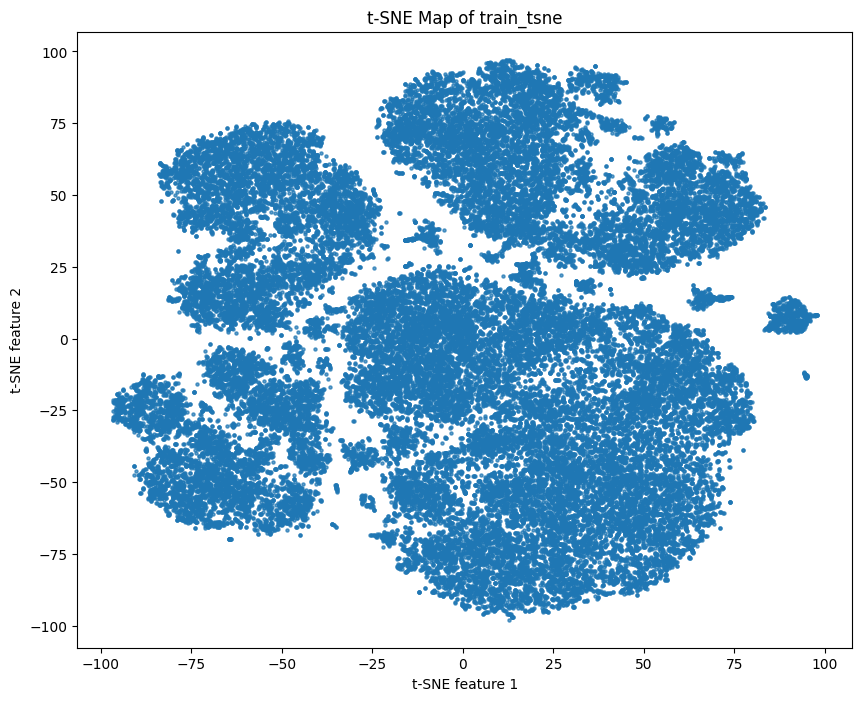

In [101]:
# Создание scatter plot по новому датасету
# Изучаем связи известных значений друг с другом
plt.figure(figsize=(10, 8))
plt.scatter(train_tsne['tSNE_f1'], train_tsne['tSNE_f2'], s=5, alpha=0.7)
plt.title("t-SNE Map of train_tsne")
plt.xlabel("t-SNE feature 1")
plt.ylabel("t-SNE feature 2")
plt.show()

In [102]:
def tSNE_feature(feature_name, train_tsne):
    """
    Создает scatter plot с градиентом цвета для указанной фичи из train_tsne.

    Parameters:
    - feature_name: str - Название столбца в train_tsne, используемого для градиента.
    - train_tsne: pd.DataFrame - DataFrame, содержащий данные t-SNE и фичу.

    Returns:
    - None
    """
    if feature_name not in train_tsne.columns:
        print(f"Предупреждение: столбец '{feature_name}' отсутствует в DataFrame train_tsne.")
        return

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        train_tsne['tSNE_f1'],
        train_tsne['tSNE_f2'],
        c=train_tsne[feature_name],
        s=5,
        alpha=0.7,
        cmap='viridis'
    )

    # Добавление цветовой шкалы
    plt.colorbar(scatter, label=f"{feature_name.capitalize()} Value")

    # Подписи
    plt.title(f"t-SNE Map of train_tsne with {feature_name.capitalize()} Gradient")
    plt.xlabel("t-SNE feature 1")
    plt.ylabel("t-SNE feature 2")

    plt.show()

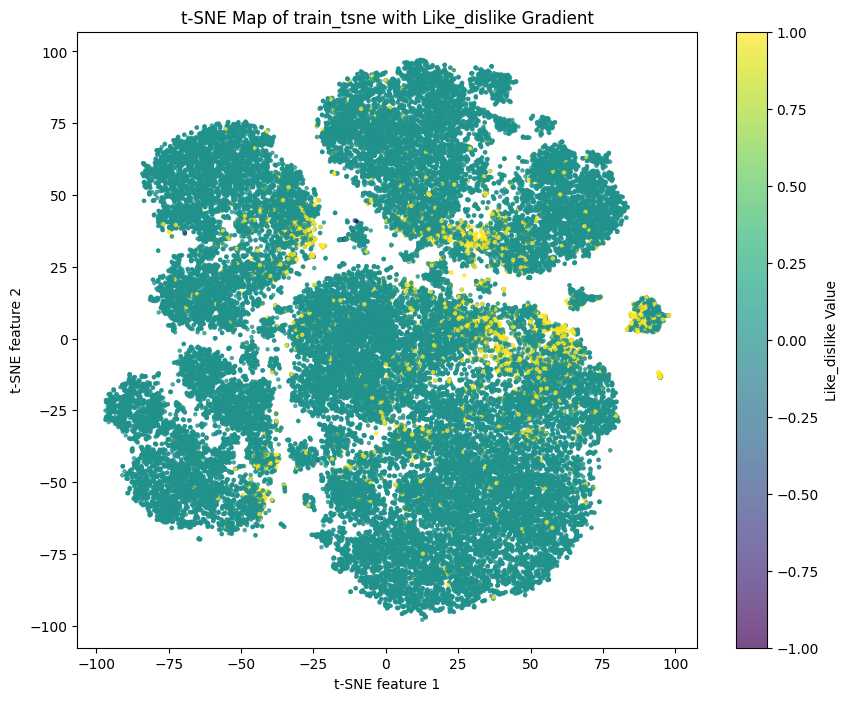

In [103]:
tSNE_feature('like_dislike', train_tsne)  # Градиент лайков и дизлайков

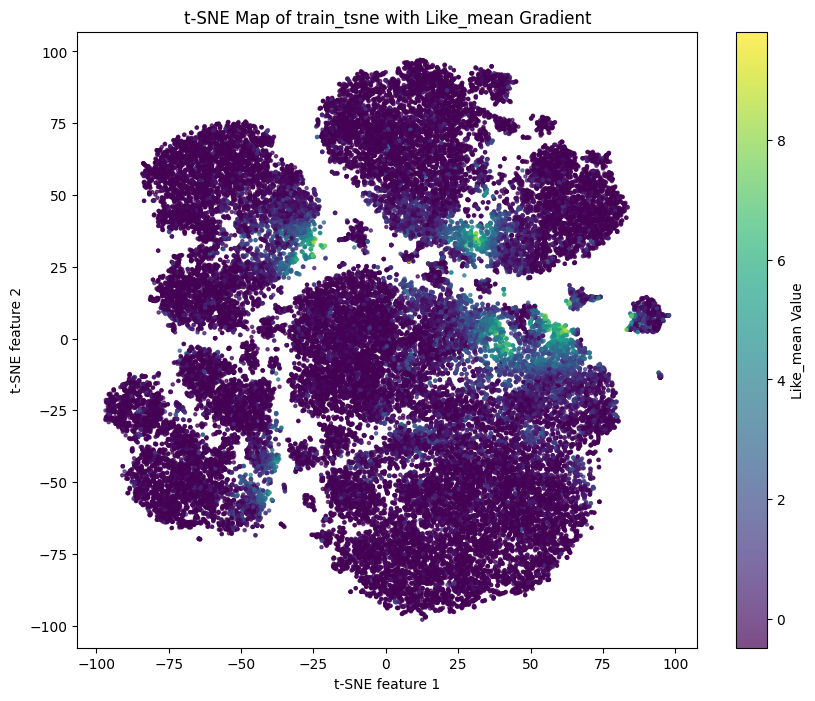

In [104]:
tSNE_feature('like_mean', train_tsne)  # обычно лайкают те, кто вообще ставит лайки

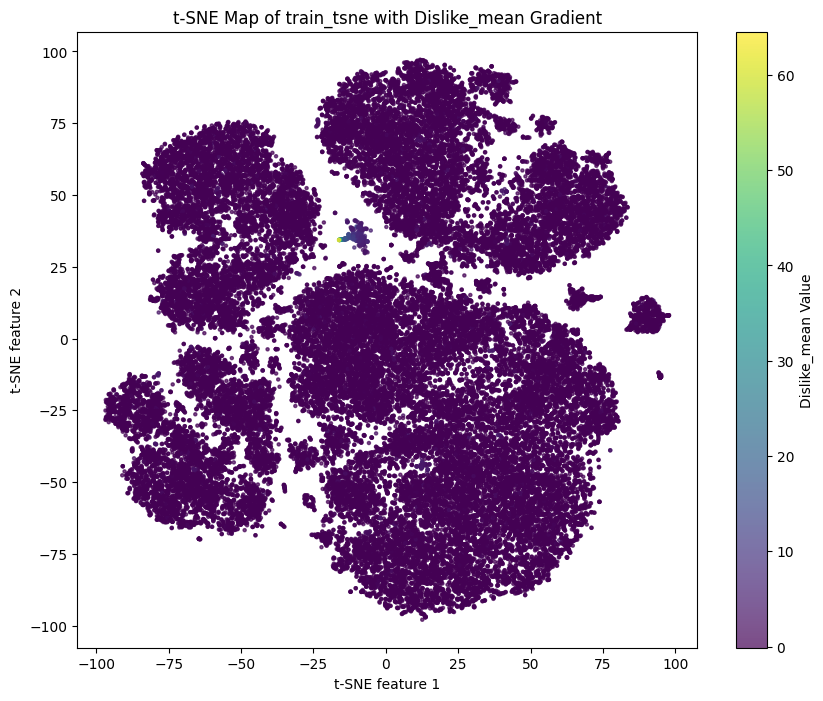

In [105]:
tSNE_feature('dislike_mean', train_tsne)  # те, кто ставит много лайков, почти никогда не ставят дизлайки

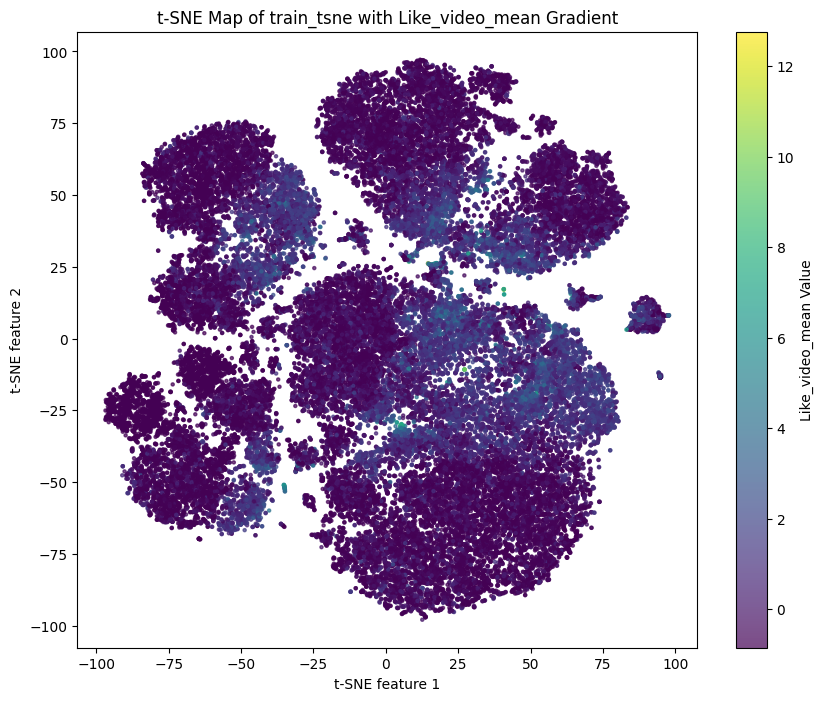

In [106]:
tSNE_feature('like_video_mean', train_tsne)  # В принципе, люди лайкают (иногда и диздайкают) те видео, которые уже лайкались

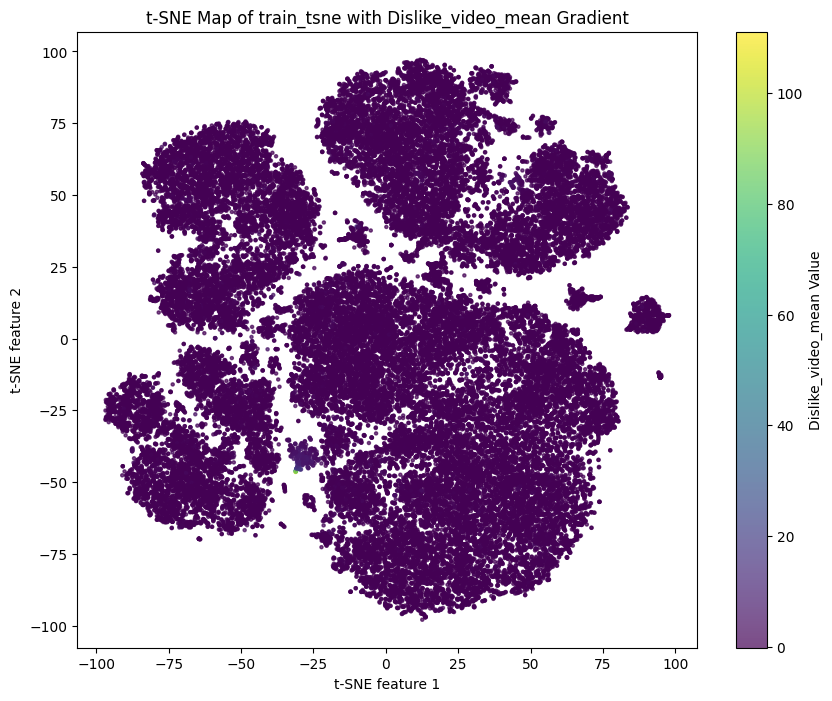

In [107]:
tSNE_feature('dislike_video_mean', train_tsne)  # Есть какие-то плохие видео, которые часто дизлайкают 

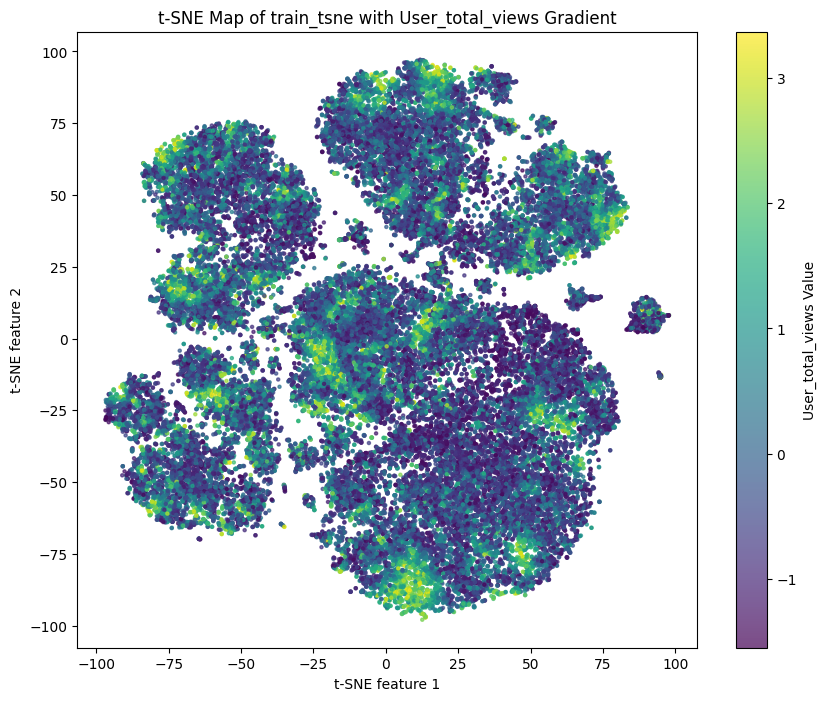

In [108]:
tSNE_feature('user_total_views', train_tsne)  # В общем-то лайкают те, кто смотрит не так много видео.

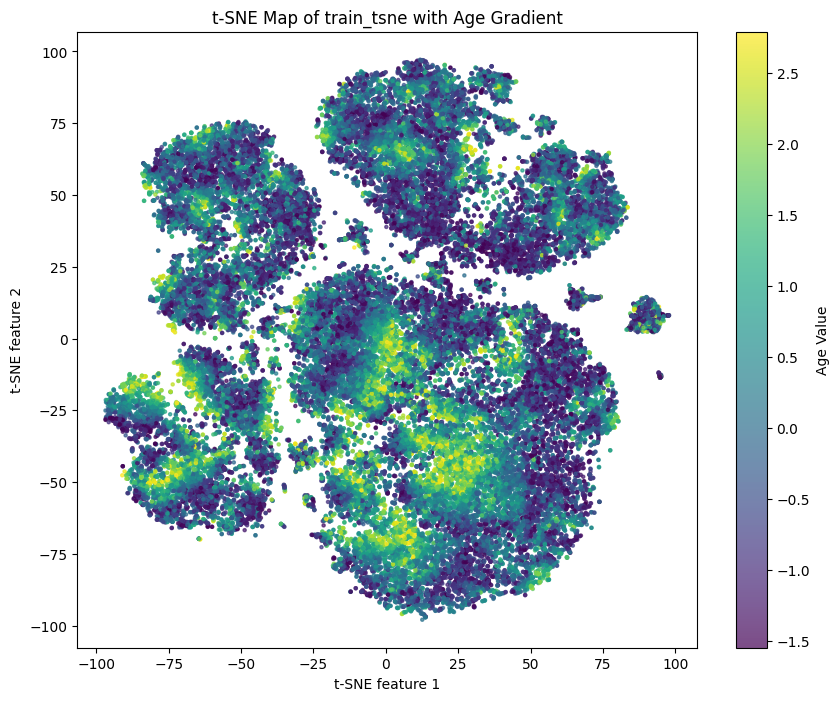

In [109]:
tSNE_feature('age', train_tsne)  # Возможно, лайки предпочитают ставить молодые

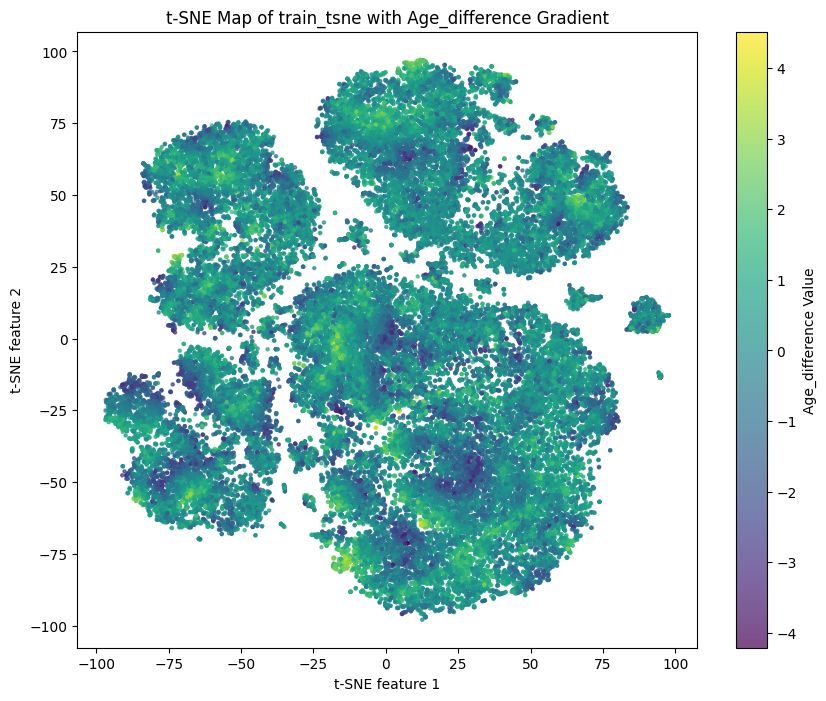

In [110]:
tSNE_feature('age_difference', train_tsne)

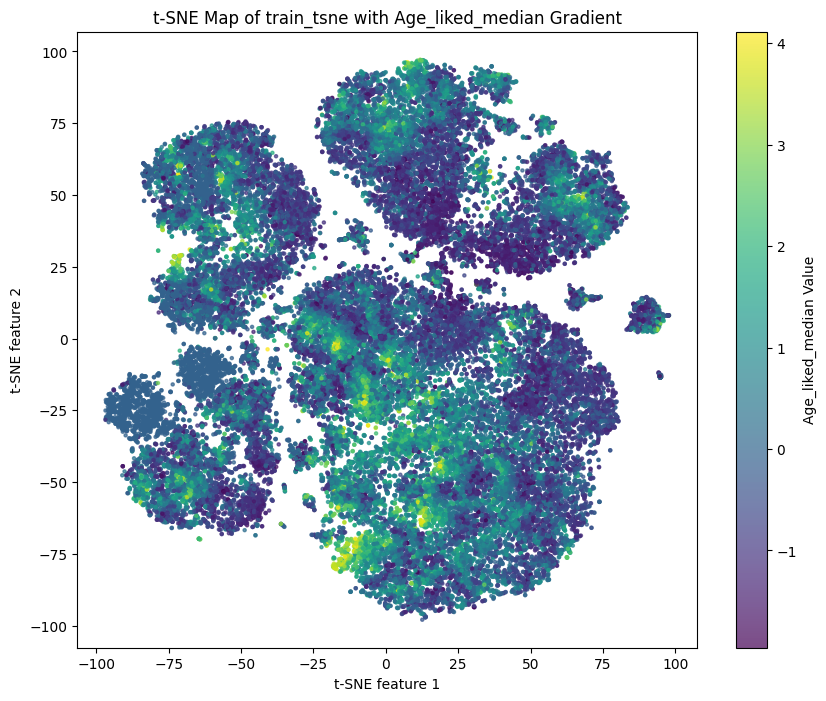

In [111]:
tSNE_feature('age_liked_median', train_tsne)  # Видео лайкаются теми, кто помоложе

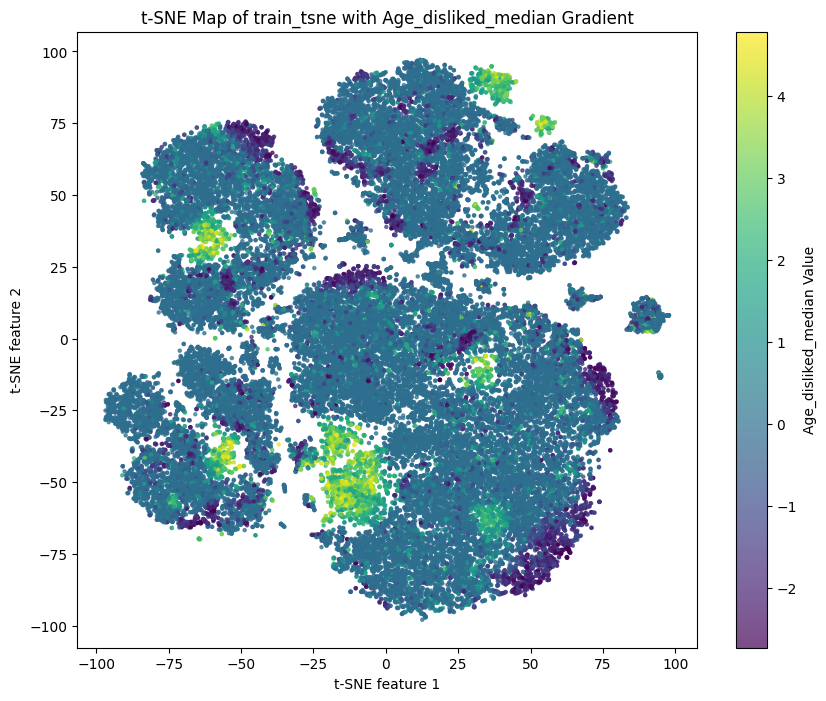

In [112]:
tSNE_feature('age_disliked_median', train_tsne)  # Похоже, что не так много возрастов в нашей выборке связано с дизлайками

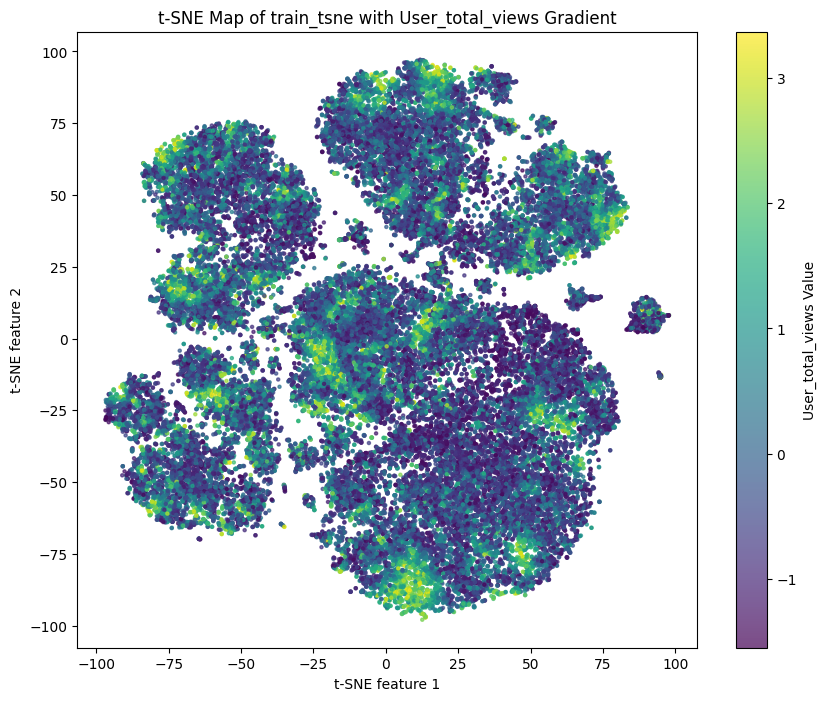

In [113]:
tSNE_feature('user_total_views', train_tsne)  # Но не всегда привычка ставить лайки связана с частотой просмотра видео

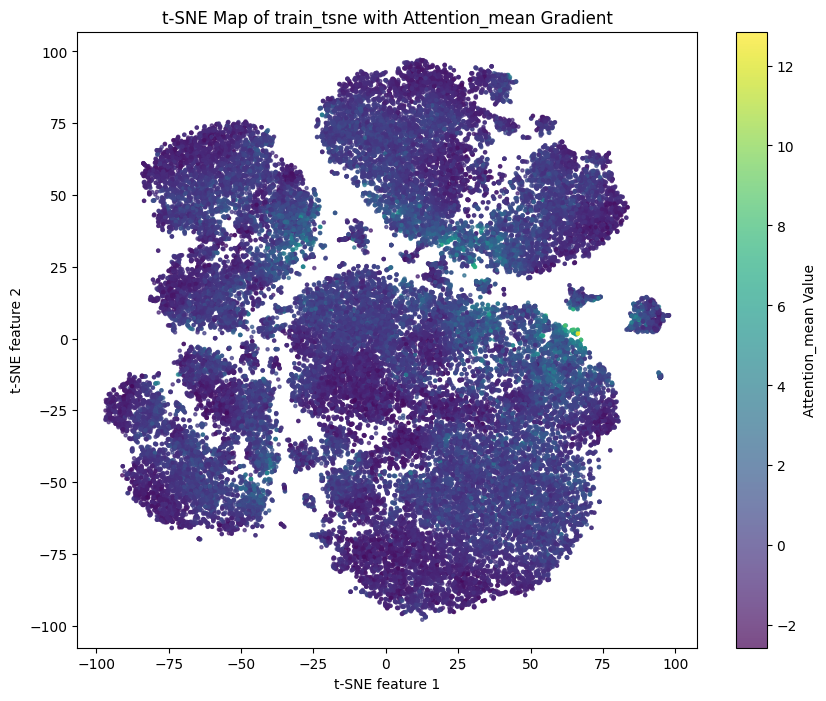

In [114]:
tSNE_feature('attention_mean', train_tsne)  # Лайковые видео привлекают больше внимания. Дизлайки ставят довльно быстро.

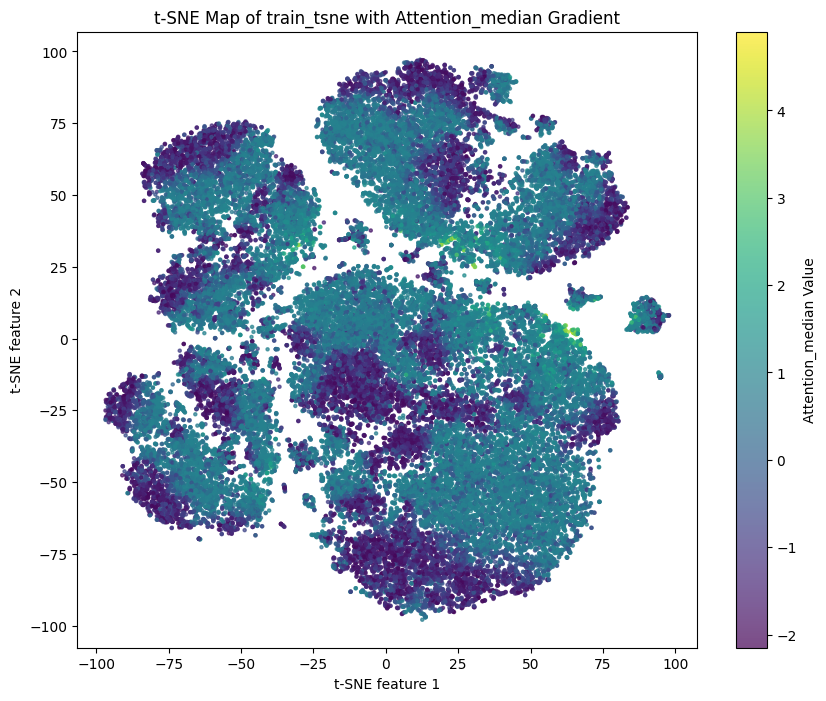

In [115]:
tSNE_feature('attention_median', train_tsne)  # Лайковые видео привлекают больше внимания, второй вариарт

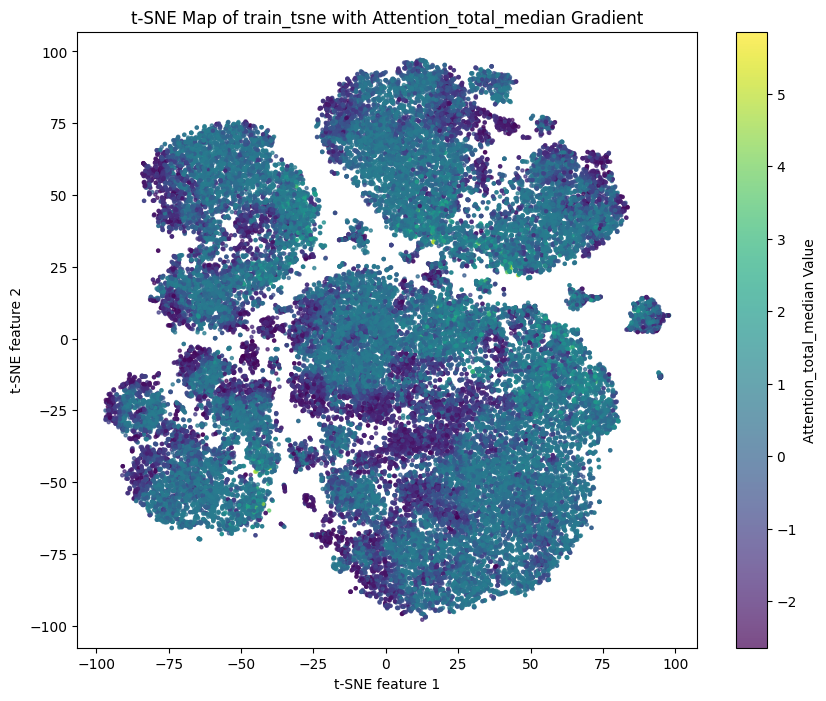

In [116]:
tSNE_feature('attention_total_median', train_tsne)  # Лайковые и некоторые другие видео приковывают взгляд. 

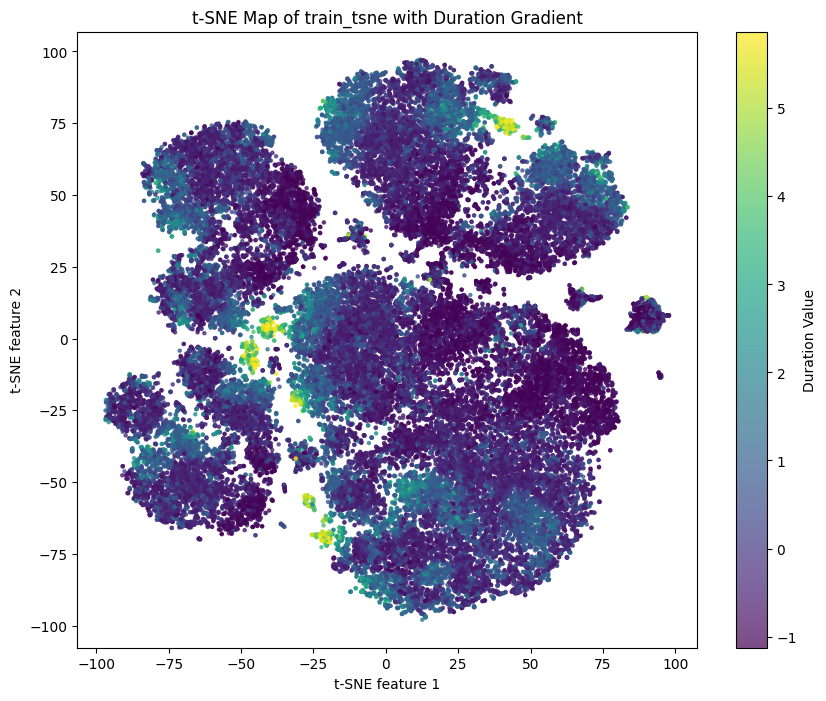

In [117]:
tSNE_feature('duration', train_tsne)  # При этом длина "лайкового" видео достаточно небольшая

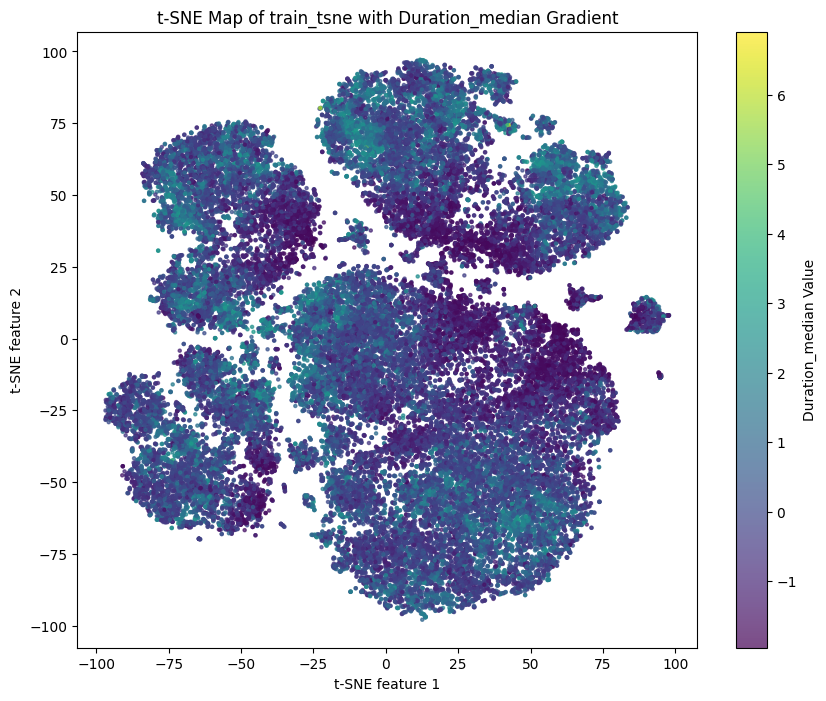

In [118]:
tSNE_feature('duration_median', train_tsne)  # Лайкающие пользователи любят смотреть короткие видео, но не всегда это так

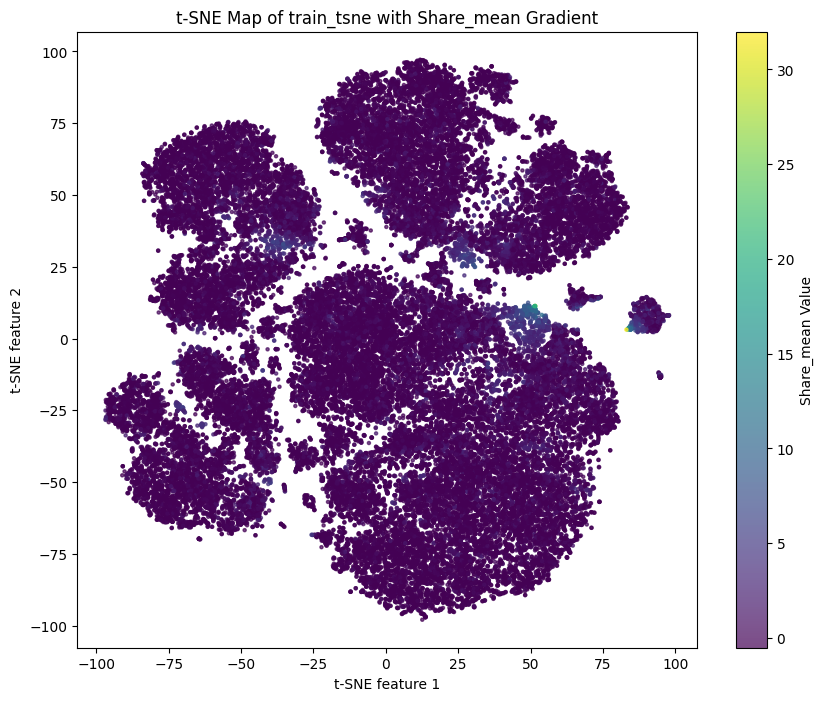

In [119]:
tSNE_feature('share_mean', train_tsne)  # Впечатление, что если видео поделились, то его не станут лайкать. Наверное, не хотят возиться.
# Может, делятся боты, которые не лайкают?

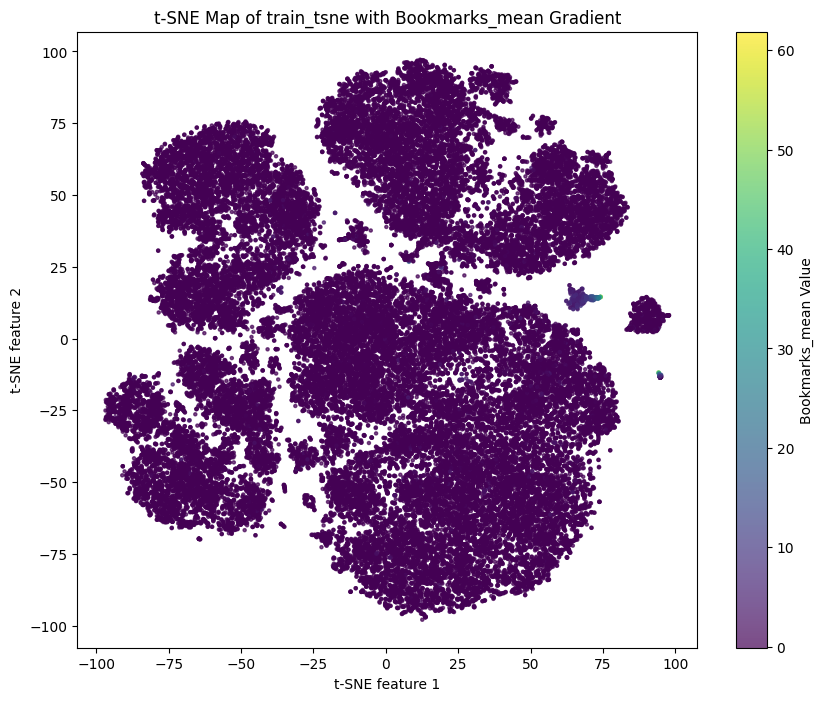

In [120]:
tSNE_feature('bookmarks_mean', train_tsne)  # Добавление в закладки иногда связано с лайками, но не всегда. Такой "подкрепляющий" признак
# Безполезная фича, в тесте признака нет.

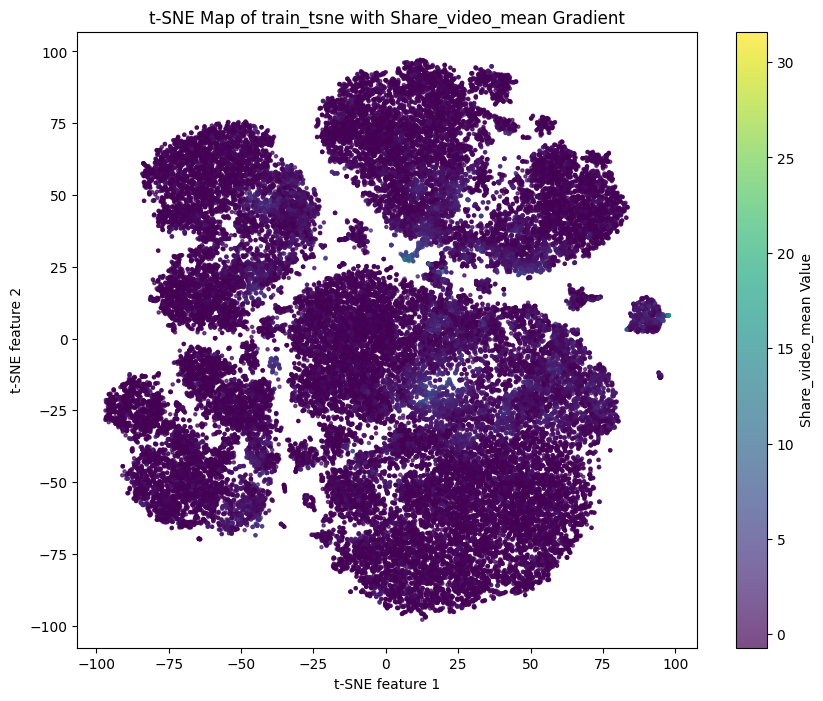

In [121]:
tSNE_feature('share_video_mean', train_tsne)  # Бывает, что видео охотно делятся, но не лайкают. Новости?

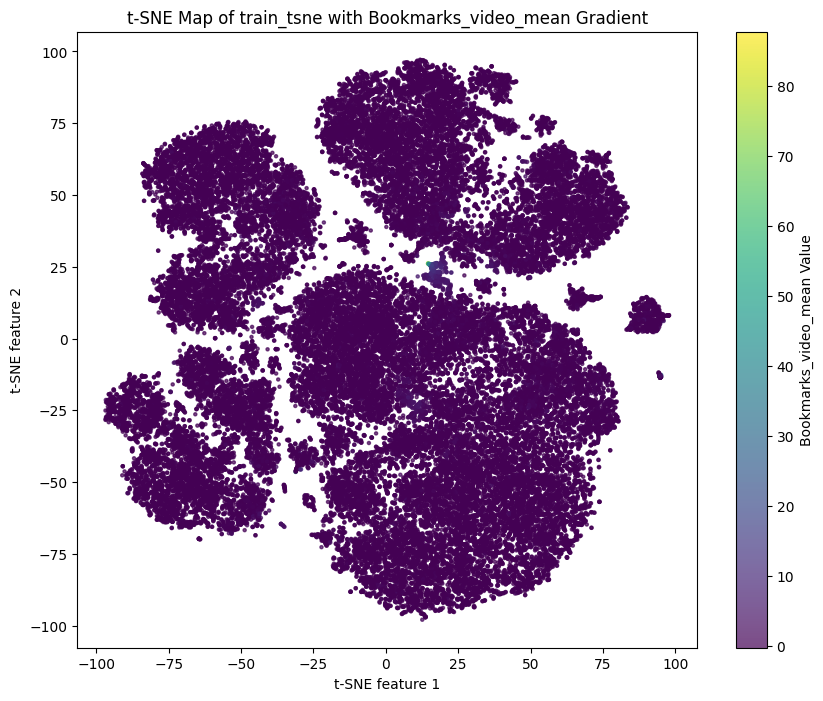

In [122]:
tSNE_feature('bookmarks_video_mean', train_tsne)  # А ещё некоторые видео добавляются в закладки, но не лайкаются. Посмотрят попозже?

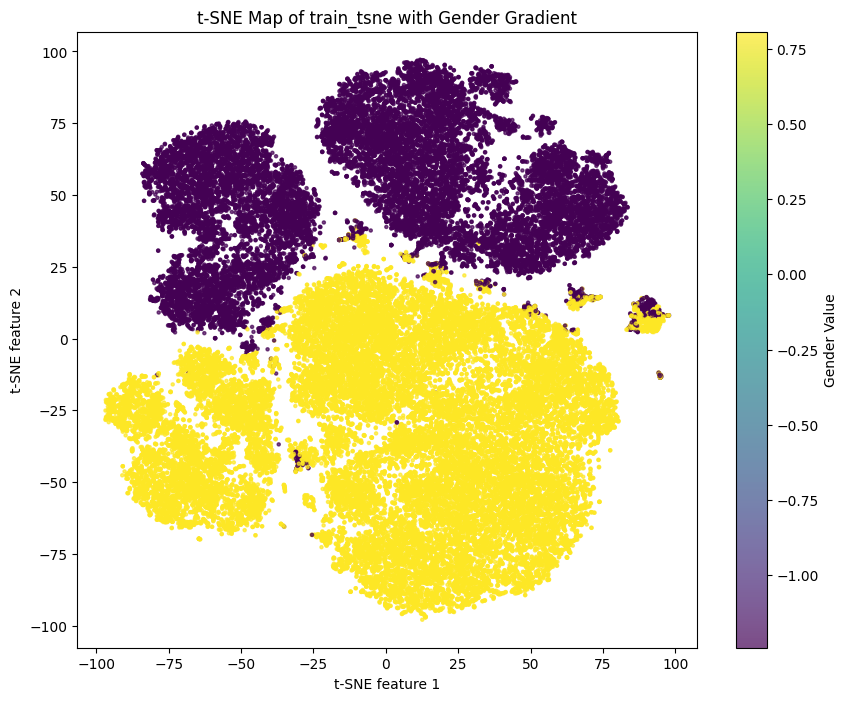

In [123]:
tSNE_feature('gender', train_tsne)  # Женщин среди зрителей больше, чем мужчин

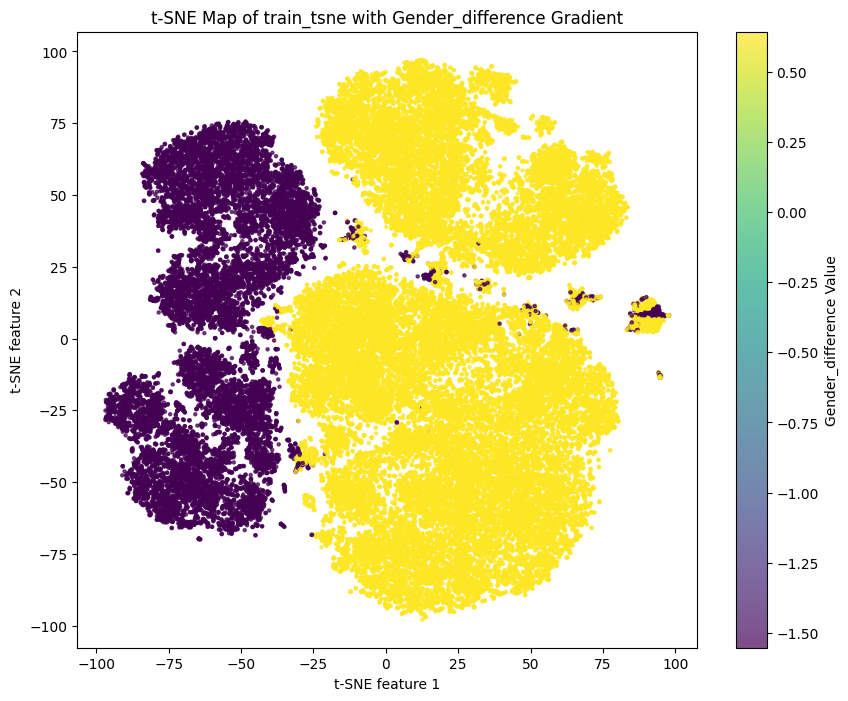

In [124]:
tSNE_feature('gender_difference', train_tsne)  # Иногда мужчины смотрят те видео, которые чаще смотрят женщины, и наоборот

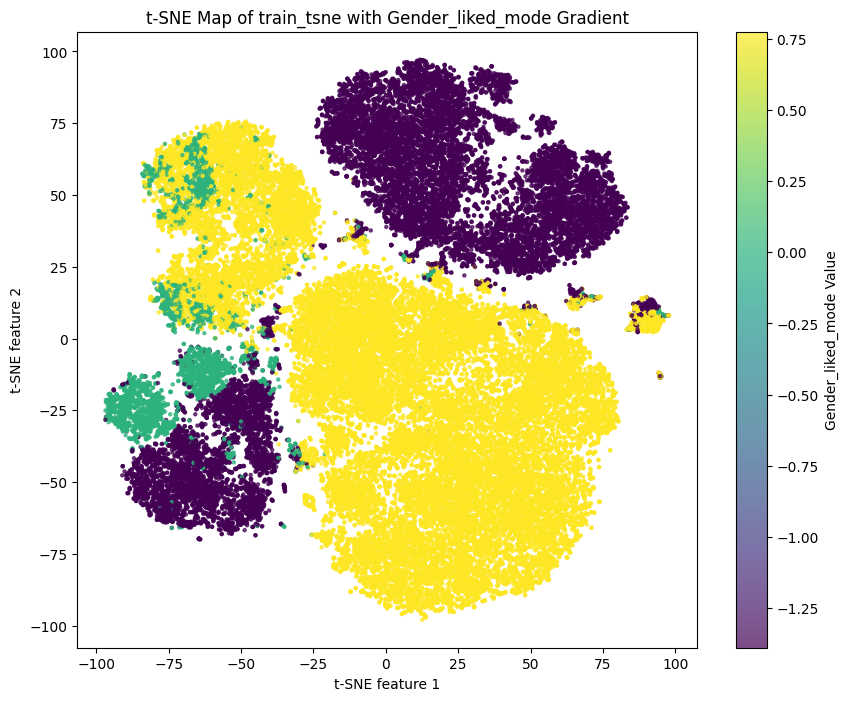

In [125]:
tSNE_feature('gender_liked_mode', train_tsne)  # Лайкают чаще в тех случаях, когда пол пользователя близок к моде пола тех, кто предпочитает это видео

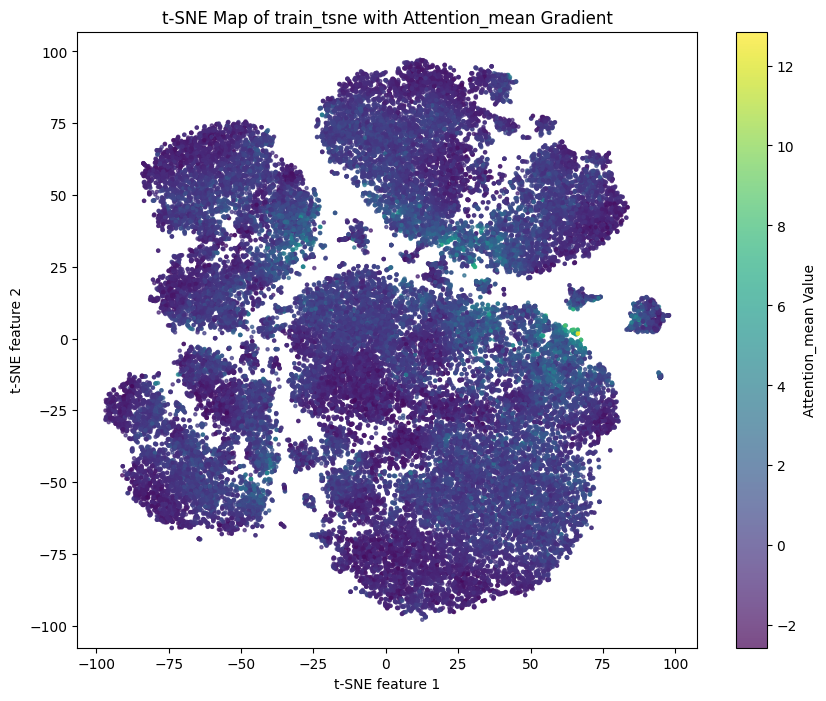

In [126]:
tSNE_feature('attention_mean', train_tsne)  # Видео с лайками смотрят дольше

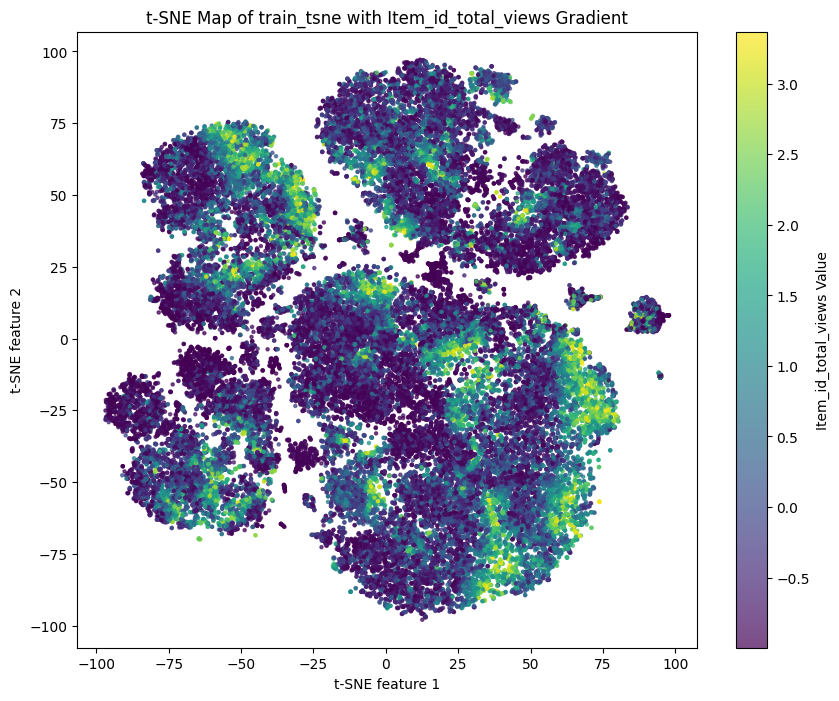

In [127]:
tSNE_feature('item_id_total_views', train_tsne)  # Лайкаются популярные видео. Неудивительно

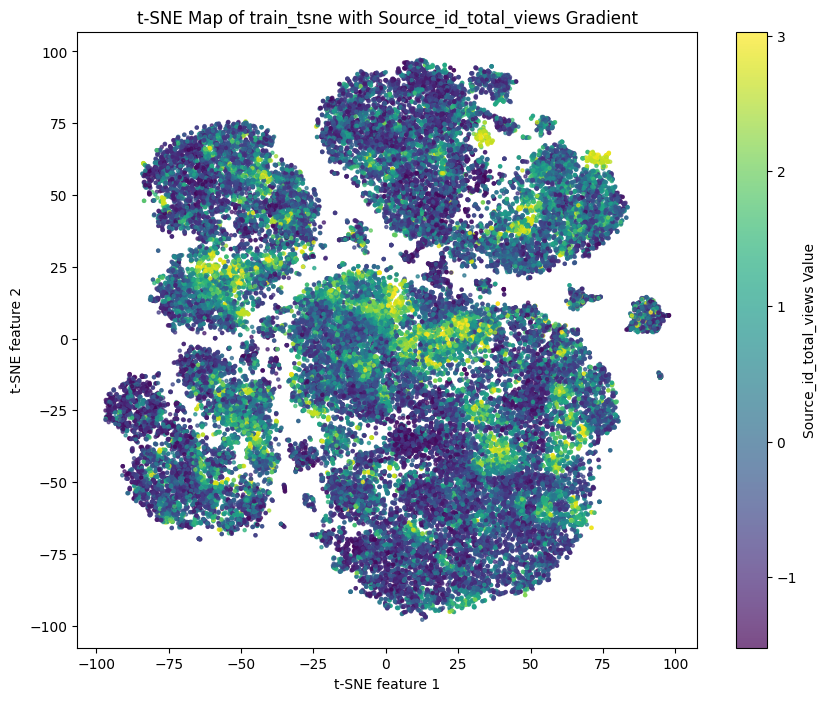

In [128]:
tSNE_feature('source_id_total_views', train_tsne)  # Достаточно часто лайкаются видео от популярных ресурсов

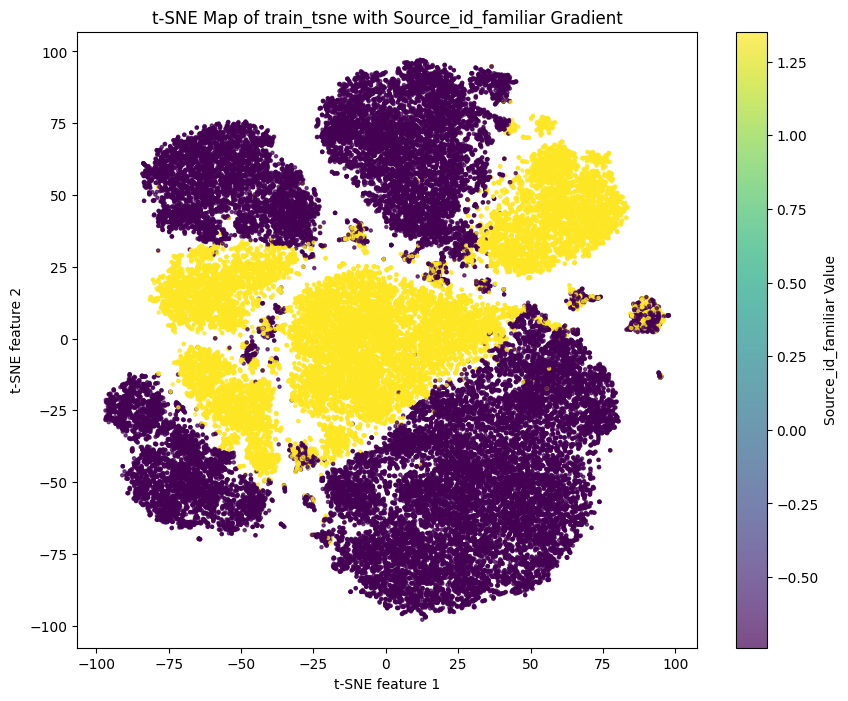

In [129]:
tSNE_feature('source_id_familiar', train_tsne)  # В некоторых случаях источник видео уже знаком, но корреляция не кажется большой

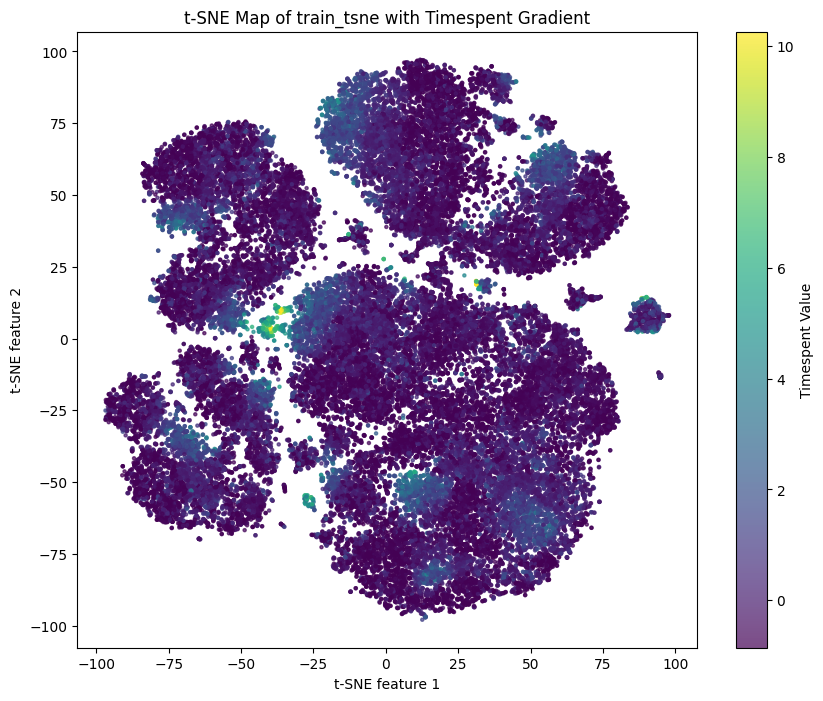

In [130]:
tSNE_feature('timespent', train_tsne)  # На некоторых видео любят "позалипать", но это не лайковые видео.

In [131]:
train_tsne.info()

<class 'pandas.core.frame.DataFrame'>
Index: 60000 entries, 19378894 to 22652596
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   timespent               60000 non-null  float64
 1   share                   60000 non-null  float64
 2   bookmarks               60000 non-null  float64
 3   gender                  60000 non-null  float64
 4   age                     60000 non-null  float64
 5   item_id_total_views     60000 non-null  float64
 6   source_id_total_views   60000 non-null  float64
 7   source_id_familiar      60000 non-null  float64
 8   user_total_views        60000 non-null  float64
 9   duration                60000 non-null  float64
 10  attention               60000 non-null  float64
 11  attention_mean          60000 non-null  float64
 12  attention_median        60000 non-null  float64
 13  duration_median         60000 non-null  float64
 14  like_mean               60000 non

In [132]:
for var, size in get_memory_usage_mb():
    print(f"{var}: {size:.6f} MB")

items: 41.548659 MB
subm: 37.882828 MB
test: 25.255264 MB
train_tsne: 13.790146 MB
train_tsne_numeric: 13.275162 MB
seen_sources: 10.000092 MB
item_counts: 3.862774 MB
_48: 2.098972 MB
female_data: 1.564804 MB
intersection: 1.288433 MB
train_item_id_unique: 1.288433 MB
items_item_id_unique: 1.288433 MB
users: 1.049583 MB
male_data: 0.883934 MB
train_user_id_unique: 0.699738 MB
users_user_id_unique: 0.699738 MB
train_tsne_like_dislike: 0.514999 MB
source_counts: 0.224468 MB
cumulative_sum: 0.224468 MB
source_ids_80_percent: 0.030235 MB
_80: 0.003485 MB
_85: 0.003424 MB
_i40: 0.003225 MB
_i102: 0.003099 MB
_i31: 0.002426 MB
_i33: 0.002325 MB
_i43: 0.002254 MB
TSNE: 0.001923 MB
_i24: 0.001757 MB
_i38: 0.001558 MB
_43: 0.001451 MB
_i49: 0.001406 MB
_i94: 0.001384 MB
_i44: 0.001352 MB
_i75: 0.001331 MB
_i30: 0.001219 MB
_i3: 0.001212 MB
_i13: 0.001203 MB
_ih: 0.001183 MB
In: 0.001183 MB
_i14: 0.001174 MB
_i36: 0.001129 MB
_oh: 0.001122 MB
Out: 0.001122 MB
_i50: 0.001121 MB
_i73: 0.001083 MB

# Простейшая модель

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

In [ ]:
simple = pd.read_parquet('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/train_interactions.parquet')

In [ ]:
simple = simple[['user_id', 'item_id', 'like', 'dislike']]
simple.head()

In [ ]:
# Генерация фич начисто
start_time = time.time()

counts = simple.groupby('user_id')['like'].mean()
simple = simple.merge(counts, on='user_id', suffixes=('', '_mean'))
counts = simple.groupby('user_id')['dislike'].mean()
simple = simple.merge(counts, on='user_id', suffixes=('', '_mean'))
counts = simple.groupby('item_id')['like'].mean()
simple = simple.merge(counts, on='item_id', suffixes=('', '_video_mean'))
counts = simple.groupby('item_id')['dislike'].mean()
simple = simple.merge(counts, on='item_id', suffixes=('', '_video_mean'))

simple = simple.drop(columns={'dislike'})

end_time = time.time()
print(f"Время выполнения: {end_time - start_time:.2f} секунд")

In [ ]:
simple

In [ ]:
simple.info()

In [ ]:
test = pd.read_csv('/kaggle/input/eda-simpmod-fi-vk-2024-a01-s06-datasets/test_pairs.csv.csv')

In [ ]:
test

In [ ]:
test.info()

In [ ]:
# Шаг 1: Группируем simple по user_id и берем уникальные значения like_mean и dislike_mean
start_time = time.time()

counts = simple.groupby('user_id', as_index=False).agg({
    'like_mean': 'first',
    'dislike_mean': 'first'
})

end_time = time.time()
print(f"Время выполнения: {end_time - start_time:.2f} секунд")

In [ ]:
# Шаг 2: Объединяем test с unique_simple по user_id
test = test.merge(
    counts,         # Используем агрегированный датасет
    on='user_id',   # Объединяем по user_id
    how='left'      # Используем left join
)

In [ ]:
# Шаг 1: Группируем simple по user_id и берем уникальные значения like_mean и dislike_mean
start_time = time.time()

counts = simple.groupby('item_id', as_index=False).agg({
    'like_video_mean': 'first',
    'dislike_video_mean': 'first'
})

end_time = time.time()
print(f"Время выполнения: {end_time - start_time:.2f} секунд")

In [ ]:
# Объединяем test с simple по item_id, выбирая только нужные колонки из simple
test = test.merge(
    counts,  # выбираем только нужные колонки из simple
    on='item_id',  # объединяем по user_id
    how='left'  # используем left join, чтобы сохранить все строки из test
)

In [ ]:
test.info()

In [ ]:
# Режем simple, оставим только часть строк
simple_sam = simple.sample(frac=0.05, random_state=42)
simple_sam.info()
del simple

In [ ]:
# Данные для модели
y = simple_sam['like']
X = simple_sam.drop(columns={'like'})

In [ ]:
# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Конвертация данных в формат DMatrix
dtrain = xgb.DMatrix(data=X_train, label=y_train)
dtest = xgb.DMatrix(data=X_test, label=y_test)


# Настройка гиперпараметров
params = {
    'objective': 'binary:logistic',  # Задача бинарной классификации
    'eval_metric': 'auc',           # Метрика AUC
    'learning_rate': 0.05,          # Скорость обучения
    'max_depth': 7,                 # Максимальная глубина деревьев
    'lambda': 1,                    # L2-регуляризация
    'alpha': 0,                     # L1-регуляризация
    'colsample_bytree': 0.8,        # Доля признаков для одного дерева
    'subsample': 0.8,               # Доля данных для построения одного дерева
    'random_state': 42              # Для воспроизводимости
}

# Обучение модели
evals = [(dtrain, 'train'), (dtest, 'eval')]
model = xgb.train(params, dtrain, num_boost_round=1000, evals=evals, early_stopping_rounds=50, verbose_eval=100)

# Оценка качества на тестовой выборке
y_pred_proba = model.predict(dtest)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC на тестовых данных: {roc_auc:.4f}")

# Сохранение модели
# model.save_model('xgboost_model.json')

In [ ]:
# Применяем модель

# Преобразование данных в DMatrix
dtest = xgb.DMatrix(data=test)

# Предсказания вероятностей для класса "лайк" (1)
predicted_probabilities = model.predict(dtest)
# predicted_probabilities = best_model.predict(dtest)

# Если нужен бинарный результат (лайк/дизлайк), можно отрегулировать порог:
# threshold = 0.5
# predicted_labels = (predicted_probabilities >= threshold).astype(int)

# Добавление предсказаний в DataFrame
test['predicted_probability'] = predicted_probabilities
# test['predicted_label'] = predicted_labels

In [ ]:
test.head()

In [ ]:
subm['predict'] = test['predicted_probability']
subm.head()

In [ ]:
# subm.to_csv(path + r'\sample_submission_simple_model.csv', index=False)
subm.to_csv('/kaggle/working/sample_submission_simple_model.csv', index=False)

# Feature importance

In [134]:
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier, CatBoostRegressor, Pool
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

In [135]:
train = pd.read_parquet('/kaggle/working/train_interactions_04_data_n_featues.parquet')
train_fi = train.sample(1000000, random_state=42)
del train

In [136]:
train_fi = train_fi.drop(columns={'user_id', 'item_id', 'source_id'})

In [137]:
# Вырежем лайки и дизлайки перед проверкой важности фич
train_fi_like_dislike = train_fi[['like_dislike']]
train_fi = train_fi.drop(columns={'like_dislike'})

In [138]:
# Забираем категориальные признаки
train_fi_cat = train_fi[['share', 'bookmarks', 'gender', 'source_id_familiar', 'gender_difference']]
train_fi = train_fi.drop(columns={'share', 'bookmarks', 'gender', 'source_id_familiar', 'gender_difference'})

In [139]:
train_fi.sample(3)

,timespent,age,item_id_total_views,source_id_total_views,user_total_views,duration,attention,attention_mean,attention_median,duration_median,...,bookmarks_mean,attention_total_median,like_video_mean,dislike_video_mean,share_video_mean,bookmarks_video_mean,age_liked_median,age_disliked_median,gender_liked_mode,age_difference
5152624,7,29,575,51.487863,863,15,0.466667,0.593774,0.571429,26.0,...,0.000000,1.000000,0.059130,0.000000,0.006957,0.000000,23,33,1.0,-6
14712343,59,42,1324,171.997093,523,59,1.000000,0.892826,1.000000,31.0,...,0.005736,0.983051,0.018127,0.000755,0.001511,0.000000,25,21,2.0,-17
17808074,151,25,1615,141.513250,403,147,1.027211,0.733476,0.920000,43.0,...,0.000000,0.666667,0.035294,0.001238,0.004954,0.001858,25,24,2.0,0


In [140]:
# Z-нормализация
train_fi = (train_fi - train_fi.mean()) / train_fi.std()

In [141]:
# Возвращаем категориальные признаки и таргет
train_fi[['share', 'bookmarks', 'gender', 'source_id_familiar', 'gender_difference']] = train_fi_cat[['share', 'bookmarks', 'gender', 'source_id_familiar', 'gender_difference']]
train_fi[['like_dislike']] = train_fi_like_dislike[['like_dislike']]
del train_fi_cat, train_fi_like_dislike

In [142]:
train_fi

,timespent,age,item_id_total_views,source_id_total_views,user_total_views,duration,attention,attention_mean,attention_median,duration_median,...,age_liked_median,age_disliked_median,gender_liked_mode,age_difference,share,bookmarks,gender,source_id_familiar,gender_difference,like_dislike
19378894,-0.765084,-0.003404,-0.652810,-1.289558,0.670406,1.096798,-0.960594,0.368166,0.348039,-0.970169,...,1.073110,-0.048902,0.774445,0.780133,0,0,2,0,1,0
19223807,0.314605,1.341166,0.834765,0.002506,-1.383330,-0.093539,0.265376,-0.663753,-1.143375,-0.609208,...,0.640741,-0.226311,0.774445,-0.888892,0,0,1,0,0,0
8733228,-0.851459,-1.347974,0.076556,-0.469811,-1.366768,-0.450640,-0.965942,-0.421950,-0.921640,-0.609208,...,-1.376984,-0.048902,-1.392435,0.362877,0,0,1,0,1,0
56071741,-0.851459,0.203453,0.838093,-0.644943,-0.842292,-0.728385,-0.935493,-1.815461,-1.966690,-0.699448,...,0.496618,-0.048902,0.774445,0.154249,0,0,1,0,0,0
42872620,0.055479,0.927452,-0.953986,-1.366019,1.595139,-0.450640,0.404294,0.387261,0.948655,2.007763,...,-0.079875,-0.048902,-0.002056,-0.993206,0,0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18780903,-0.117271,-0.210261,3.168738,-0.383986,0.145930,-0.609351,0.404294,-0.520210,-0.347054,-0.158006,...,0.208371,-0.581129,0.774445,0.362877,0,0,1,0,0,0
30393349,-0.549146,-0.830831,-0.498063,0.163782,0.308794,-0.252250,-0.605863,-1.040952,-1.596488,0.834638,...,-0.223998,-0.048902,-1.392435,0.675819,0,0,1,0,1,0
22155351,0.055479,0.720595,0.145333,0.117904,-0.447555,0.819053,-0.446364,-0.238997,0.138836,0.924878,...,0.784864,0.305916,0.774445,-0.158694,0,0,2,0,1,0
13292518,-0.246833,0.410310,-0.991702,2.067303,-1.239790,-0.768063,0.506829,0.713832,0.447339,-1.331130,...,-0.512245,-0.048902,-1.392435,-0.784578,0,0,1,0,1,0


In [143]:
y = train_fi['like_dislike']
X = train_fi.drop(columns={'like_dislike'})
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [144]:
cat_cols = ['share', 'bookmarks', 'gender', 'source_id_familiar', 'gender_difference']

In [145]:
clf = CatBoostClassifier(random_seed=42,
                        thread_count=-1,
                        use_best_model=True,
                        cat_features=cat_cols,
                        colsample_bylevel =  0.1,
                        subsample = 0.8,
                        bootstrap_type='Bernoulli')

clf.fit(X_train, y_train,
        eval_set=(X_test, y_test),
        verbose=300,
        plot=False,
        early_stopping_rounds=100)

print(clf.get_best_score())

Learning rate set to 0.123421
0:	learn: 0.8930464	test: 0.8928788	best: 0.8928788 (0)	total: 227ms	remaining: 3m 46s
300:	learn: 0.0980985	test: 0.0986676	best: 0.0986652 (299)	total: 46.2s	remaining: 1m 47s
600:	learn: 0.0954556	test: 0.0977278	best: 0.0977278 (600)	total: 1m 31s	remaining: 1m 1s
900:	learn: 0.0935231	test: 0.0975171	best: 0.0975126 (895)	total: 2m 17s	remaining: 15.1s
999:	learn: 0.0929772	test: 0.0974705	best: 0.0974690 (998)	total: 2m 33s	remaining: 0us

bestTest = 0.09746898204
bestIteration = 998

Shrink model to first 999 iterations.
{'learn': {'MultiClass': 0.09297716972884491}, 'validation': {'MultiClass': 0.09746898204412971}}


In [146]:
# Посмотрим важность признаков с точки зрения CatBoost
fi = clf.get_feature_importance(prettified=True)
fi[:20] # .style.background_gradient(cmap='viridis', subset=pd.IndexSlice[0:10, 'Importances'])

,Feature Id,Importances
0,like_mean,16.080847
1,dislike_video_mean,12.342172
2,like_video_mean,8.052298
3,dislike_mean,7.655675
4,attention,6.034714
5,timespent,6.001219
6,age_difference,4.819225
7,attention_total_median,3.211356
8,duration_median,3.196332
9,item_id_total_views,2.983685


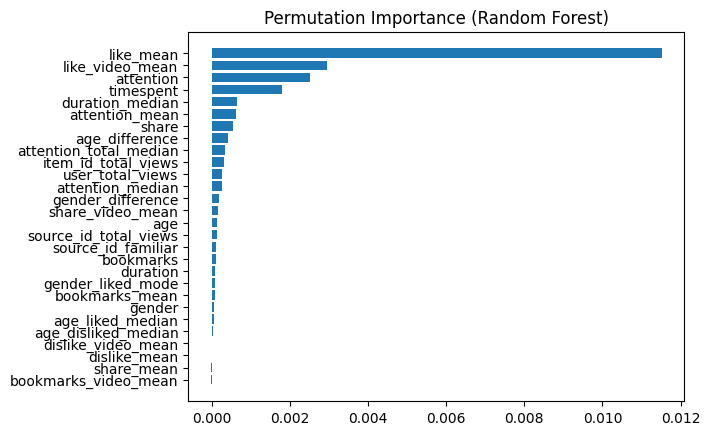

In [147]:
rf_clf = RandomForestClassifier().fit(X_train, y_train)

perm_importance = permutation_importance(rf_clf, X_test, y_test, n_repeats=10, random_state=42)

sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(range(len(sorted_idx)), perm_importance.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), X_test.columns[sorted_idx])
plt.title("Permutation Importance (Random Forest)")
plt.show()

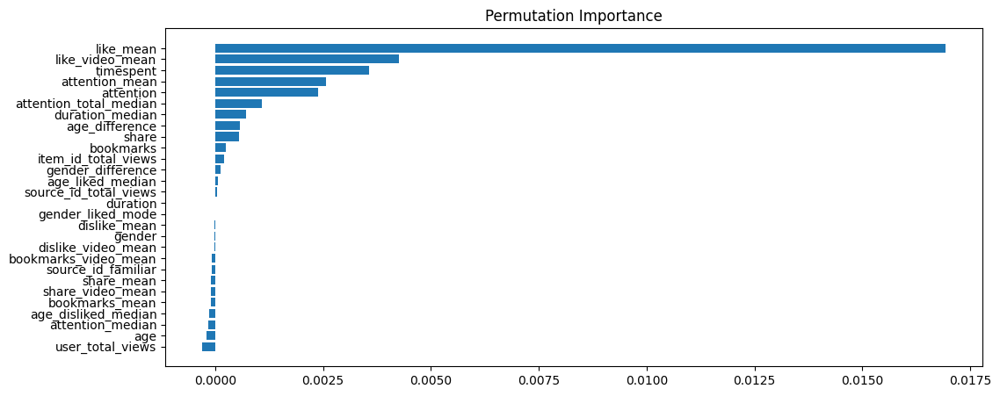

In [148]:
X_test = X_test.sample(50000, random_state=42)
y_test = y_test.sample(50000, random_state=42)
perm_importance = permutation_importance(clf, X_test, y_test, n_repeats=10, random_state=42)
sorted_idx = perm_importance.importances_mean.argsort()
fig = plt.figure(figsize=(12, 5))
plt.barh(range(len(sorted_idx)), perm_importance.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Permutation Importance');